In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error, r2_score, median_absolute_error
)
import matplotlib.pyplot as plt

In [2]:
# === Feature Engineering ===
def calculate_rsi(series, window=14):
    delta = series.diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    avg_gain = gain.rolling(window).mean()
    avg_loss = loss.rolling(window).mean()
    rs = avg_gain / avg_loss
    return 100 - (100 / (1 + rs))

def calculate_ema(series, span):
    return series.ewm(span=span, adjust=False).mean()

def enrich_features(df):
    df['RSI'] = calculate_rsi(df['Close'])
    df['EMA12'] = calculate_ema(df['Close'], 12)
    df['EMA26'] = calculate_ema(df['Close'], 26)
    df['EMA20'] = calculate_ema(df['Close'], 20)
    df['MACD'] = df['EMA12'] - df['EMA26']
    df['Rolling_Avg_5'] = df['Close'].rolling(5).mean()
    df['Rolling_Avg_21'] = df['Close'].rolling(21).mean()
    df['Rolling_STD_20'] = df['Close'].rolling(20).std()
    df['Lag_1'] = df['Close'].shift(1)
    df['Lag_5'] = df['Close'].shift(5)
    df['Lag_10'] = df['Close'].shift(10)
    df['daily_return'] = df['Close'].pct_change()
    df['Rolling_Return_5'] = df['daily_return'].rolling(5).mean()
    df['Rolling_Volume_20'] = df['Volume'].rolling(20).mean()
    df['Price_Range'] = df['High'] - df['Low']
    df['Volatility_Ratio'] = df['Price_Range'] / df['Close']
    df['Close_t+5'] = df['Close'].shift(-5)
    df['Direction_t+5'] = (df['Close_t+5'] > df['Close']).astype(int)
    return df

features = [
    'RSI', 'EMA12', 'EMA20', 'EMA26', 'MACD',
    'Rolling_Avg_5', 'Rolling_Avg_21', 'Rolling_STD_20',
    'Lag_1', 'Lag_5', 'Lag_10',
    'daily_return', 'Rolling_Return_5',
    'Rolling_Volume_20', 'Price_Range', 'Volatility_Ratio'
]


In [3]:
# === Load hyperparameters ===
def load_hyperparameters(filepath):
    hyperparams = {}
    with open(filepath, 'r') as f:
        for line in f:
            parts = line.strip().split(',')
            if len(parts) != 3:
                continue
            ticker, n_estimators, max_depth = parts
            try:
                n_estimators = int(n_estimators)
            except ValueError:
                n_estimators = 100
            try:
                max_depth = int(max_depth) if max_depth != 'None' else None
            except ValueError:
                max_depth = None
            hyperparams[ticker.upper()] = {
                'n_estimators': n_estimators,
                'max_depth': max_depth,
                'learning_rate': 0.05
            }
    return hyperparams

# === Fiscal windows ===
fiscal_windows = [
    ("2013-01-01", "2015-12-31"),
    ("2014-01-01", "2016-12-31"),
    ("2015-01-01", "2017-12-31"),
    ("2016-01-01", "2018-12-31"),
    ("2017-01-01", "2019-12-31"),
    ("2018-01-01", "2020-12-31"),
    ("2019-01-01", "2021-12-31"),
    ("2020-01-01", "2022-12-31"),
    ("2021-01-01", "2023-12-30"),
]

In [4]:
# Path and file locations
data_dir = Path("/WAVE/projects/CSEN-140-Sp25/team_3/FinalDataFolder")
hyperparam_file = "hyperparams.txt"
hyperparams_by_ticker = load_hyperparameters(hyperparam_file)

# Begin iteration
preprocessed_data = {}

# Preload and preprocess all stocks once
for path in data_dir.glob("*.csv"):
    ticker = path.stem.upper()
    df = pd.read_csv(path, header=[0, 1], index_col=0)
    df.columns = [col[0] for col in df.columns]
    df.index = pd.to_datetime(df.index, errors='coerce', utc=True)
    df.sort_index(inplace=True)
    for col in ['Close', 'High', 'Low', 'Open', 'Volume']:
        df[col] = pd.to_numeric(df[col], errors='coerce')
    df = enrich_features(df)
    df.dropna(subset=features + ['Close_t+5'], inplace=True)
    if not df.empty:
        preprocessed_data[ticker] = df

print("Preloaded")

Preloaded



=== Window: 2013-01-01 to 2015-12-31 | Test until 2016-12-31 ===
MAE: 5.7397 | RMSE: 12.5441 | R²: 0.9875 | MAPE: 8.07% | Median AE: 2.6430 | StdErr: 12.0624 | Dir Acc: 48.90%

Top K Stocks by Performance-per-Price:

    Ticker                      Date   Predicted     Actual      Error  \
154   ENPH 2016-12-30 05:00:00+00:00    2.260200   1.050000  -1.210200   
384   SEDG 2016-12-30 05:00:00+00:00   20.339200  13.200000  -7.139200   
372     RL 2016-12-30 05:00:00+00:00  107.792339  78.938499 -28.853839   
54    BBWI 2016-12-30 05:00:00+00:00   49.117800  42.685219  -6.432581   
86      CF 2016-12-30 05:00:00+00:00   29.197618  26.498270  -2.699348   
324   NWSA 2016-12-30 05:00:00+00:00   11.699398  10.674748  -1.024650   
424   TSLA 2016-12-30 05:00:00+00:00   15.627507  14.466000  -1.161507   
171      F 2016-12-30 05:00:00+00:00    9.700837   9.082815  -0.618022   
255     KR 2016-12-30 05:00:00+00:00   31.071390  29.361557  -1.709833   
323    NWS 2016-12-30 05:00:00+00:00   11.

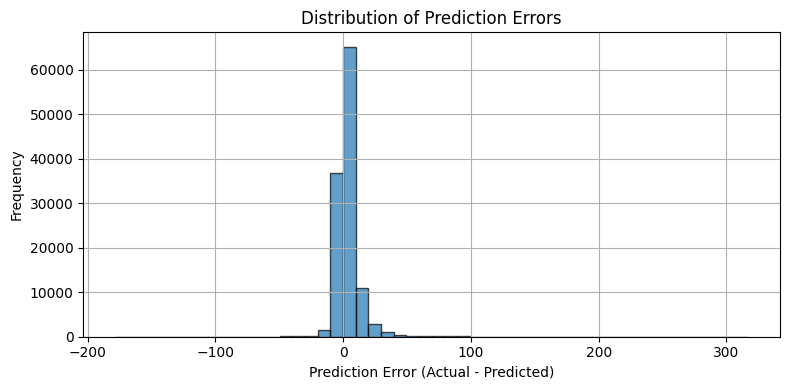

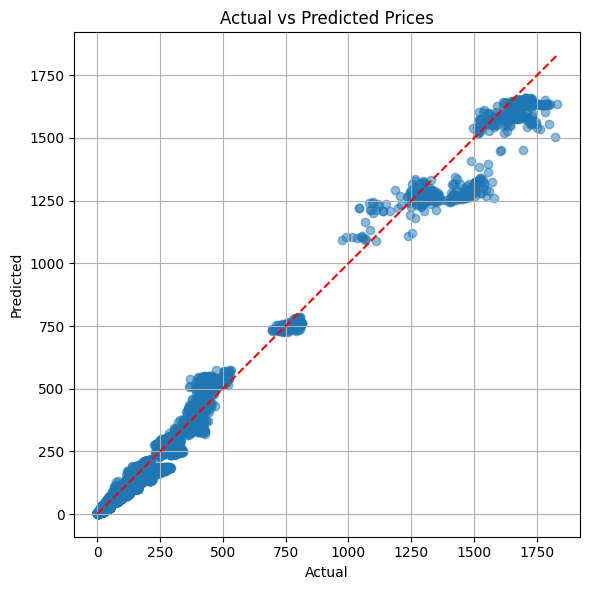

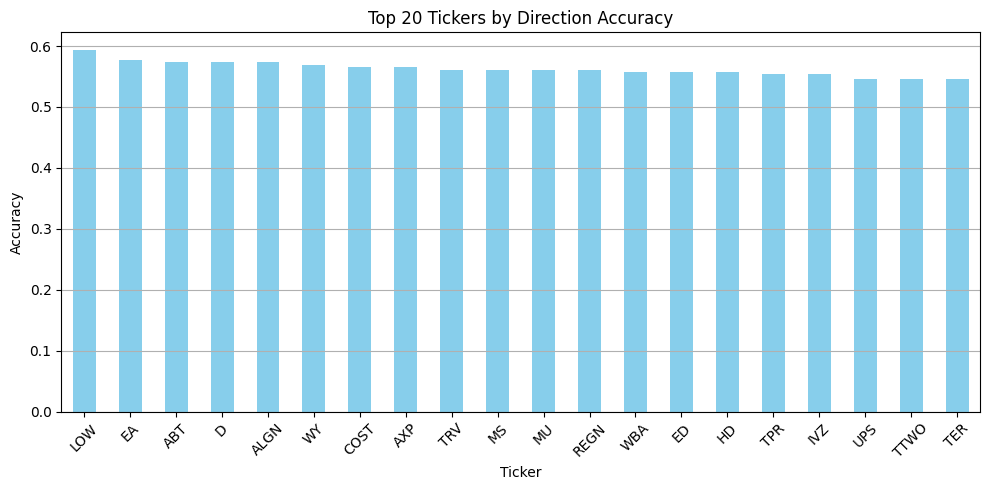

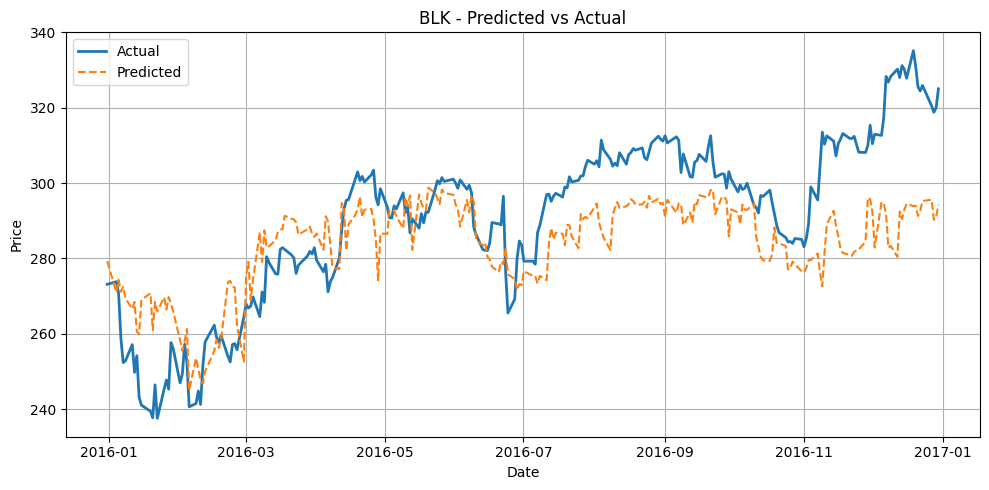

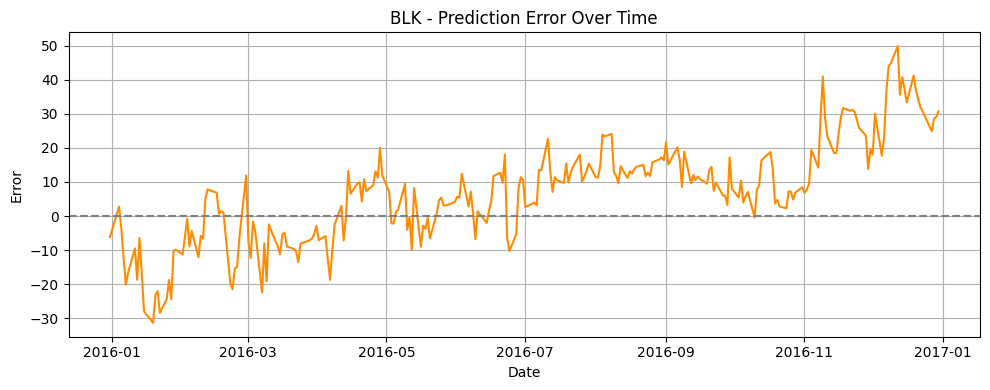

...

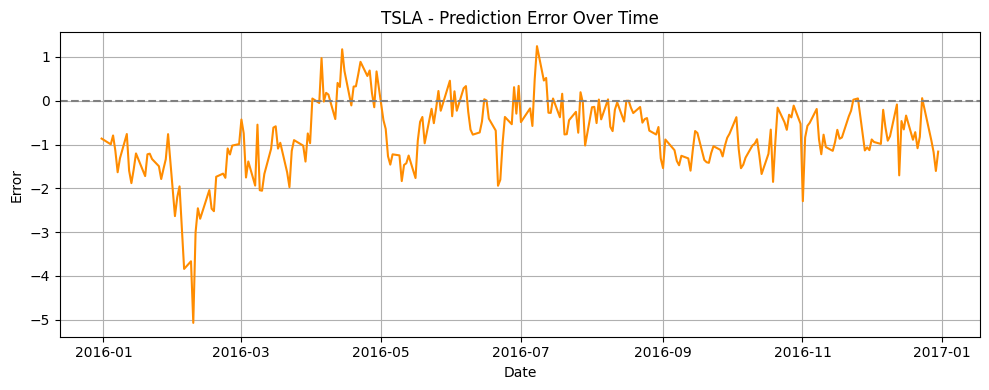

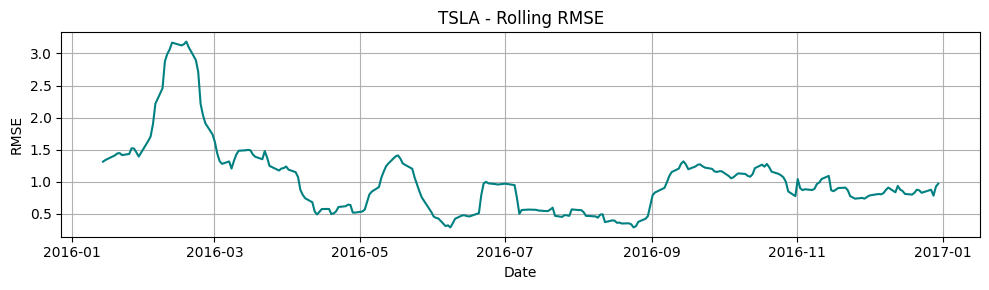

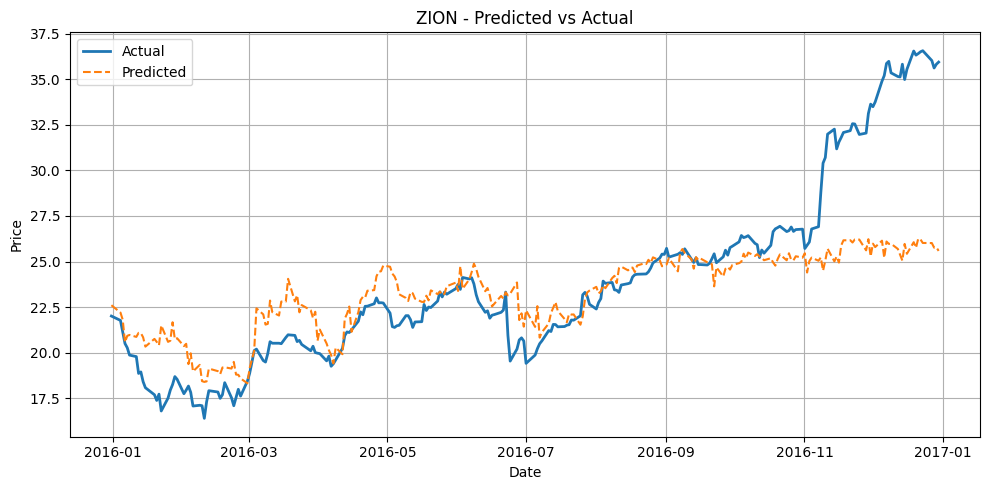

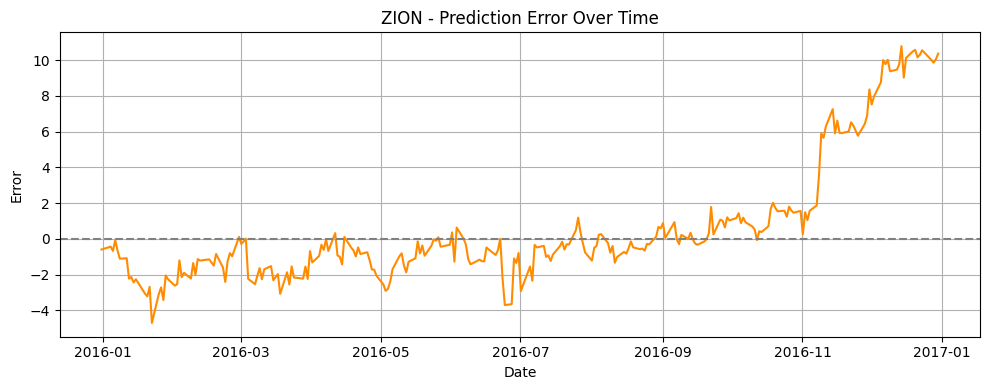

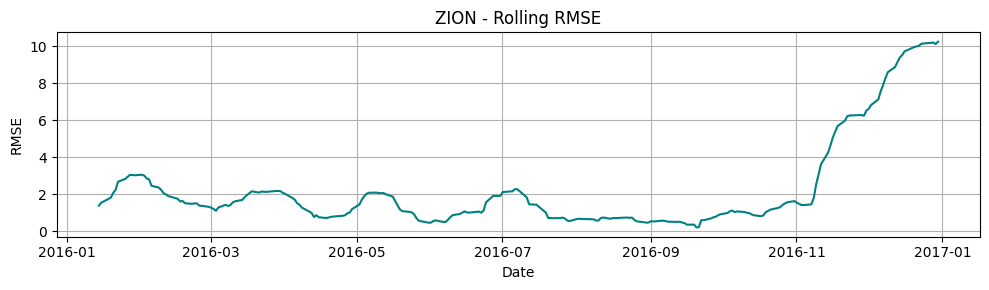


=== Window: 2014-01-01 to 2016-12-31 | Test until 2017-12-31 ===
MAE: 11.6605 | RMSE: 50.7000 | R²: 0.8930 | MAPE: 9.92% | Median AE: 3.9057 | StdErr: 49.5831 | Dir Acc: 48.98%

Top K Stocks by Performance-per-Price:

    Ticker                      Date   Predicted      Actual      Error  \
98     CMG 2017-12-29 05:00:00+00:00  382.314800  292.950012 -89.364788   
189     GE 2017-12-29 05:00:00+00:00  132.259336  103.101936 -29.157400   
455    WBD 2017-12-29 05:00:00+00:00   26.329700   23.110001  -3.219699   
54    BBWI 2017-12-29 05:00:00+00:00   44.310519   40.348148  -3.962370   
341    PCG 2017-12-29 05:00:00+00:00   48.063600   44.490002  -3.573598   
359    PPL 2017-12-29 05:00:00+00:00   24.867230   23.059795  -1.807435   
139    DVA 2017-12-29 05:00:00+00:00   78.217900   72.540001  -5.677899   
450   VTRS 2017-12-29 05:00:00+00:00   42.018374   39.050587  -2.967787   
209    HES 2017-12-29 05:00:00+00:00   45.744833   43.629620  -2.115214   
449    VTR 2017-12-29 05:00:00+

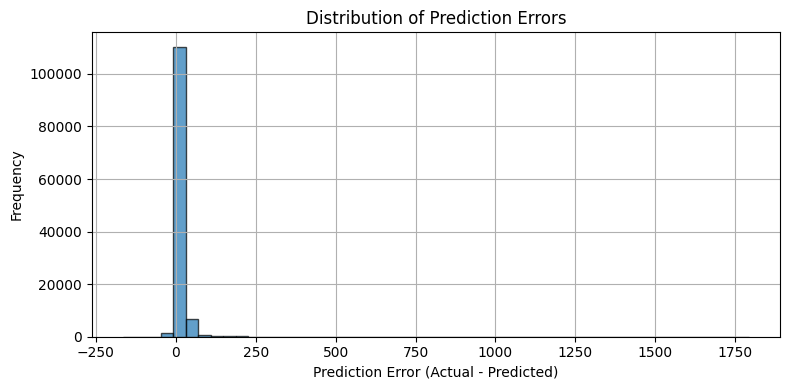

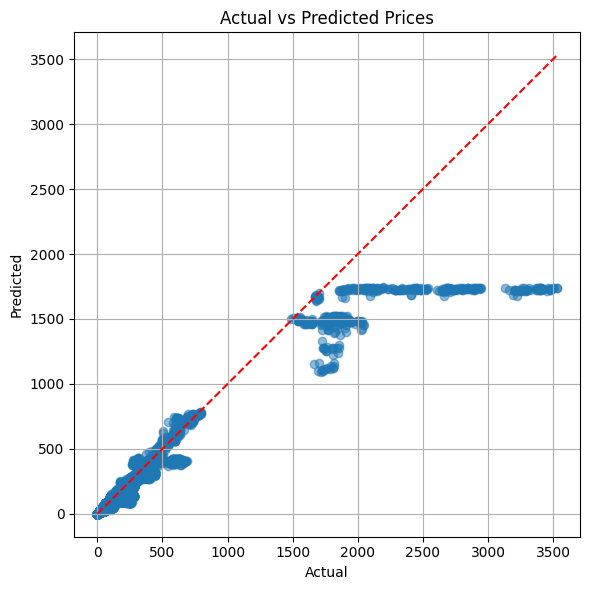

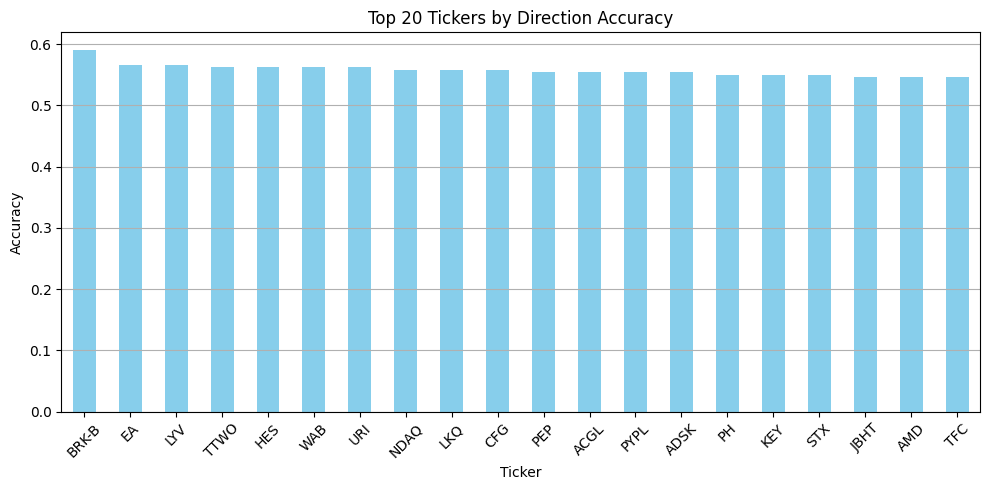

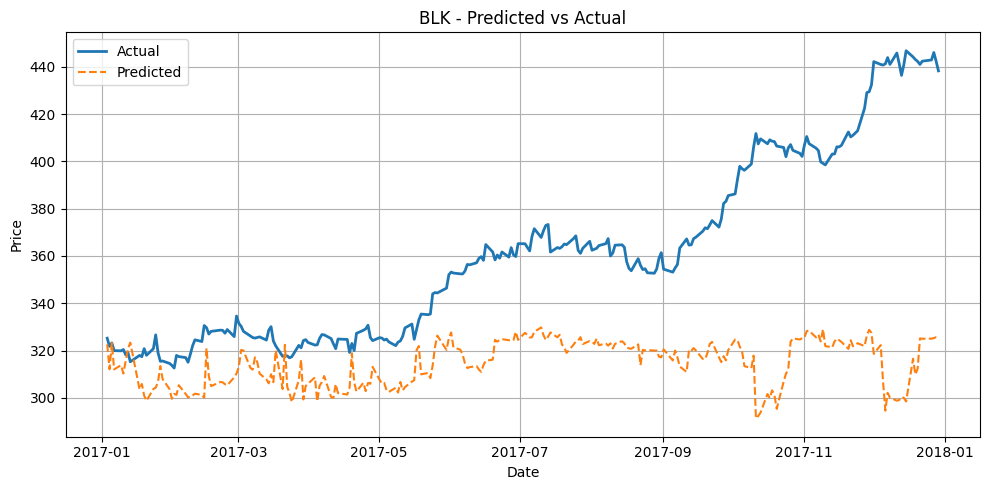

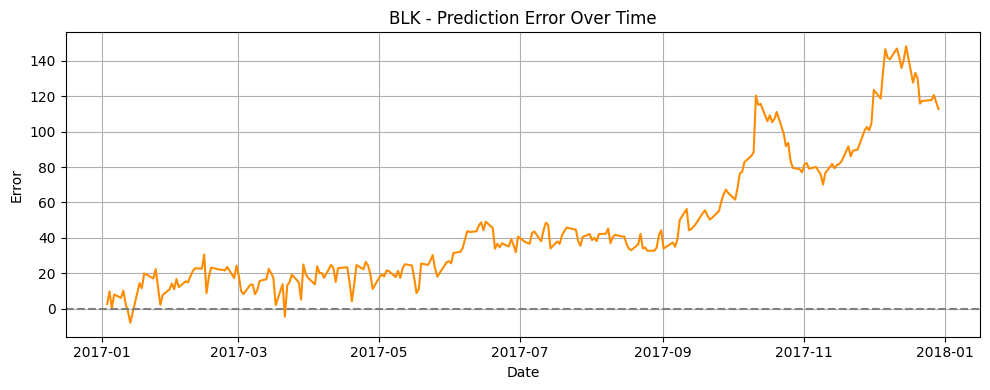

...

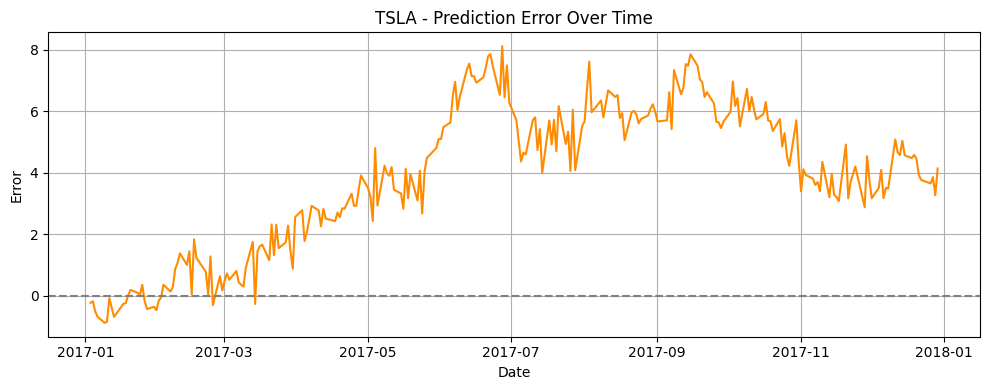

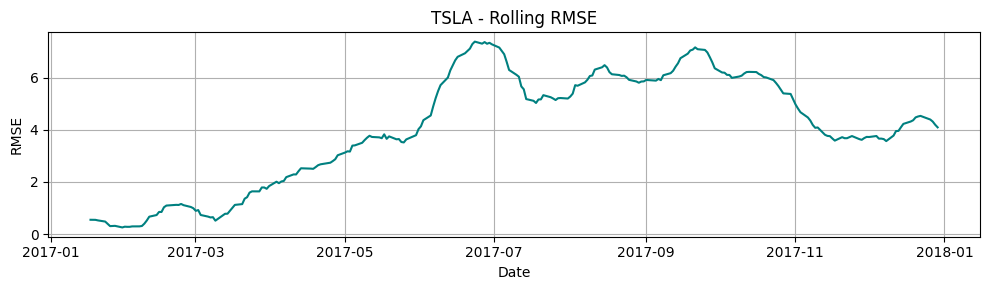

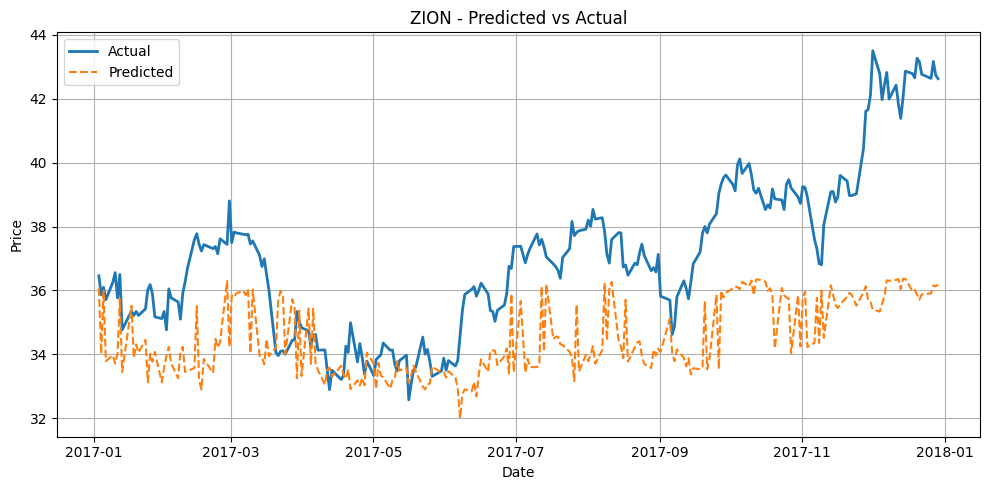

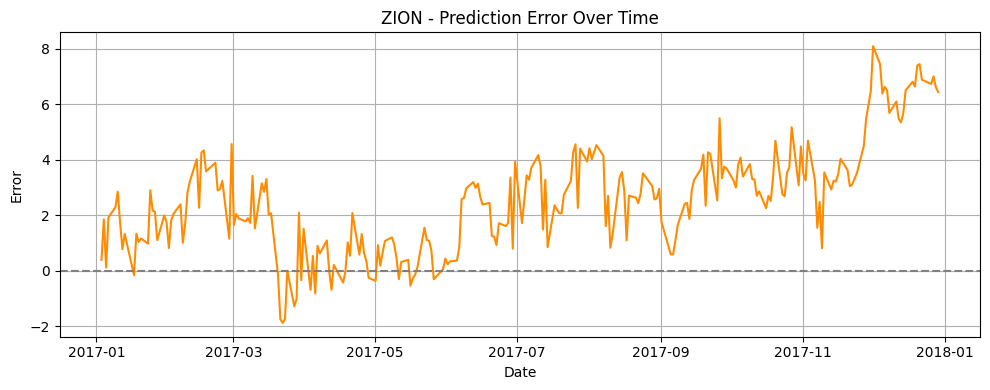

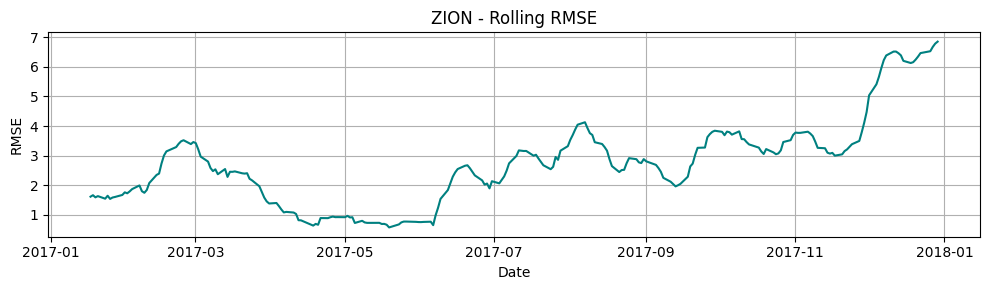


=== Window: 2015-01-01 to 2017-12-31 | Test until 2018-12-31 ===
MAE: 9.6612 | RMSE: 23.5301 | R²: 0.9811 | MAPE: 8.77% | Median AE: 3.6951 | StdErr: 22.5456 | Dir Acc: 49.79%

Top K Stocks by Performance-per-Price:

    Ticker                      Date   Predicted      Actual      Error  \
189     GE 2018-12-28 05:00:00+00:00  112.177505   44.638218 -67.539287   
345    PCG 2018-12-28 05:00:00+00:00   47.568861   23.750000 -23.818861   
394    SLB 2018-12-28 05:00:00+00:00   53.993804   31.505136 -22.488668   
159    EQT 2018-12-28 05:00:00+00:00   27.964650   18.094570  -9.870080   
253    KHC 2018-12-28 05:00:00+00:00   52.829396   34.431484 -18.397912   
37     APA 2018-12-28 05:00:00+00:00   35.186482   23.914639 -11.271844   
241    IVZ 2018-12-28 05:00:00+00:00   19.254221   13.321972  -5.932249   
75     CAG 2018-12-28 05:00:00+00:00   25.524924   18.256935  -7.267989   
291    MHK 2018-12-28 05:00:00+00:00  161.454700  116.959999 -44.494701   
475   XRAY 2018-12-28 05:00:00+0

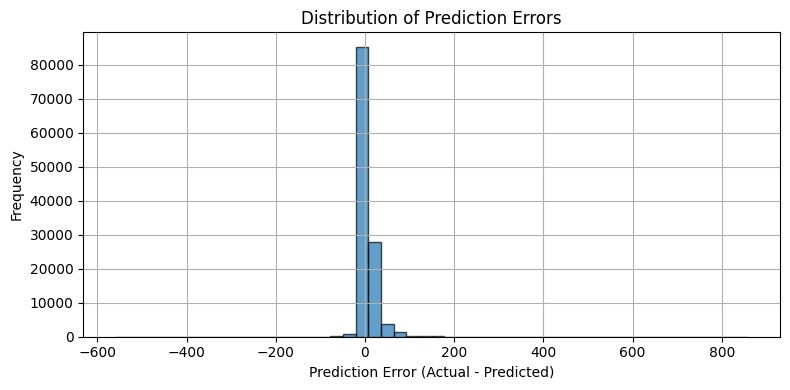

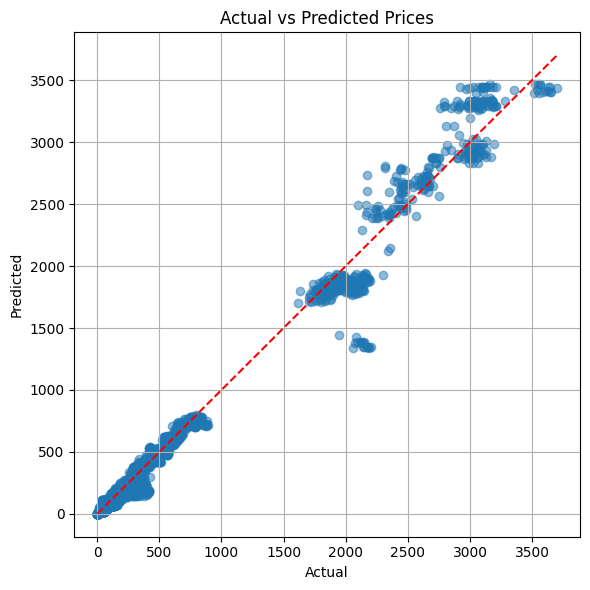

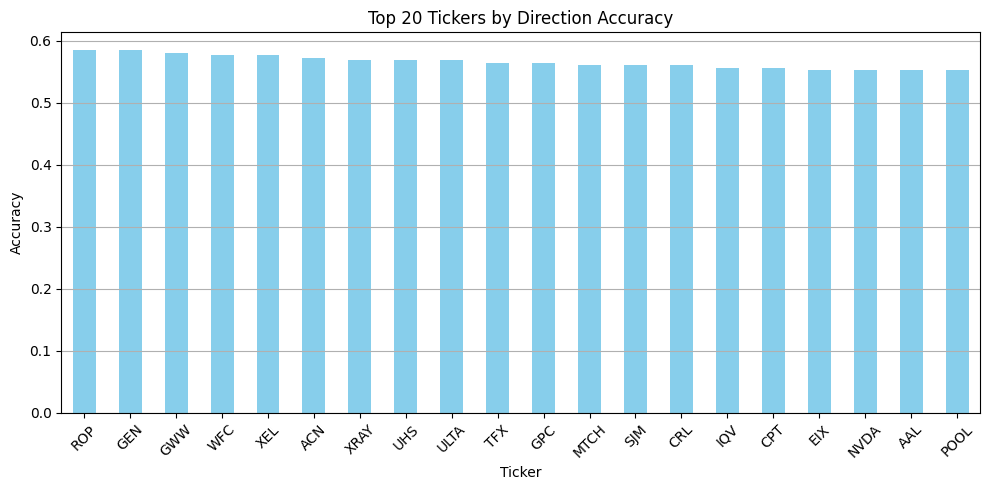

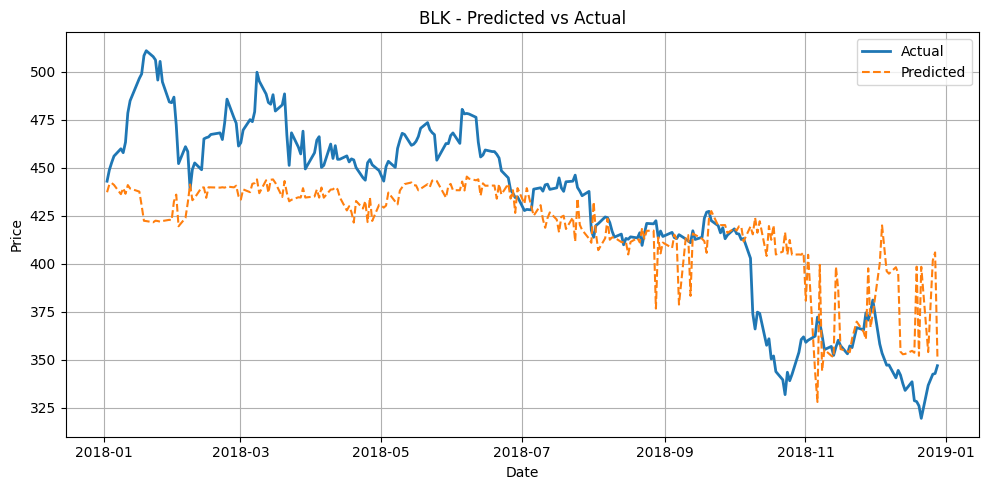

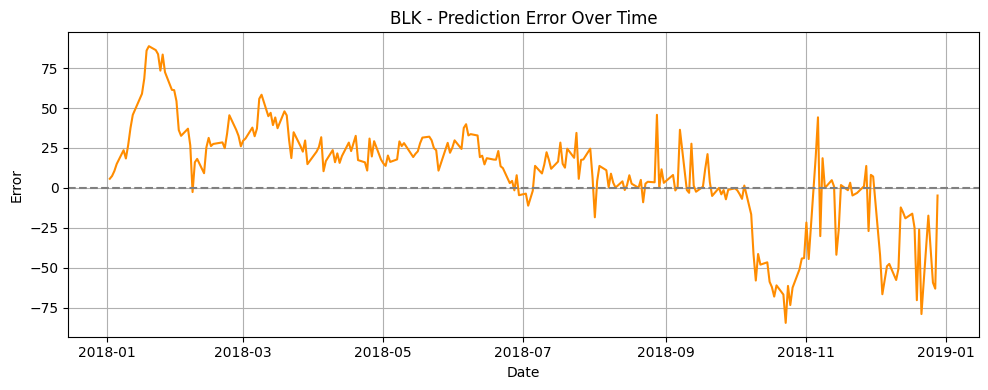

...

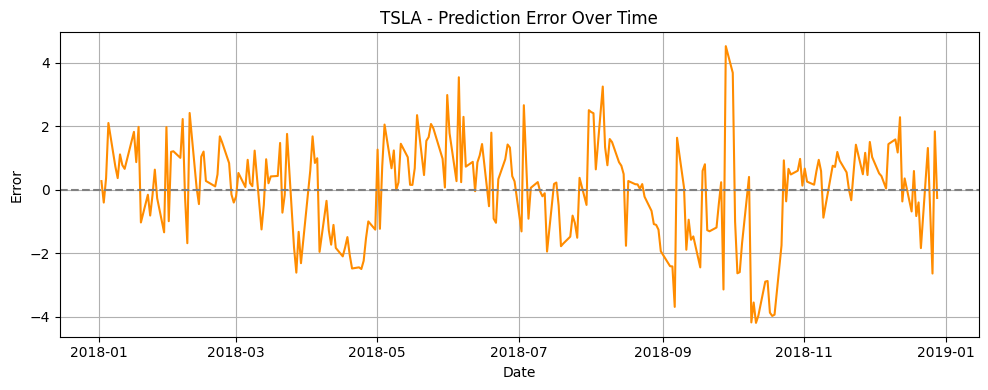

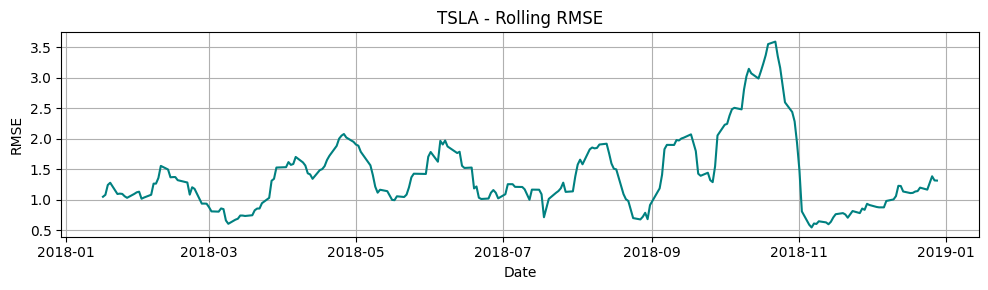

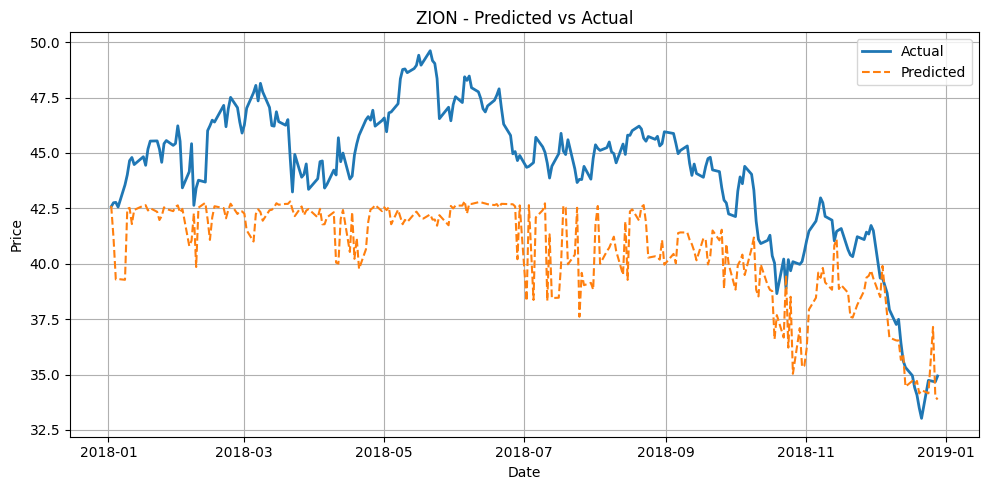

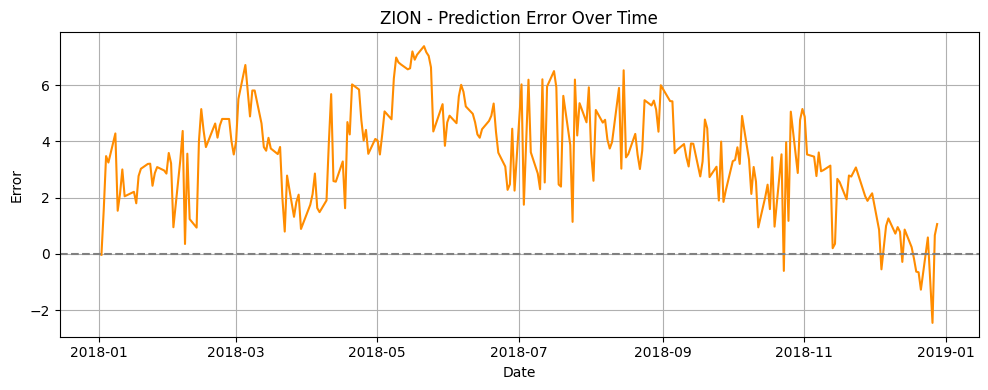

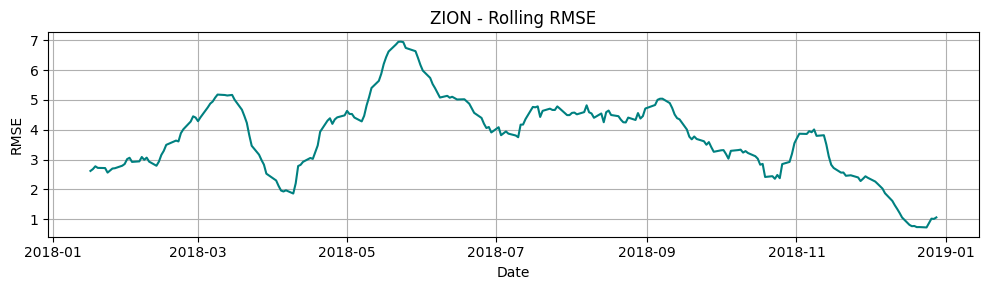


=== Window: 2016-01-01 to 2018-12-31 | Test until 2019-12-31 ===
MAE: 12.3036 | RMSE: 31.5333 | R²: 0.9733 | MAPE: 9.58% | Median AE: 4.1980 | StdErr: 29.9886 | Dir Acc: 49.58%

Top K Stocks by Performance-per-Price:

    Ticker                      Date  Predicted     Actual      Error  \
345    PCG 2019-12-30 05:00:00+00:00  23.140200  10.870000 -12.270200   
159    EQT 2019-12-30 05:00:00+00:00  18.406719  10.527111  -7.879608   
455   VTRS 2019-12-30 05:00:00+00:00  29.809789  18.207300 -11.602489   
54    BBWI 2019-12-30 05:00:00+00:00  21.439548  13.868058  -7.571490   
253    KHC 2019-12-30 05:00:00+00:00  39.287818  27.131340 -12.156478   
339    OXY 2019-12-30 05:00:00+00:00  52.480332  39.187931 -13.292401   
204    HAL 2019-12-30 05:00:00+00:00  29.315748  23.158052  -6.157696   
37     APA 2019-12-30 05:00:00+00:00  30.414206  24.182554  -6.231651   
461    WDC 2019-12-30 05:00:00+00:00  77.467321  62.155804 -15.311517   
424    TPR 2019-12-30 05:00:00+00:00  30.366577  24

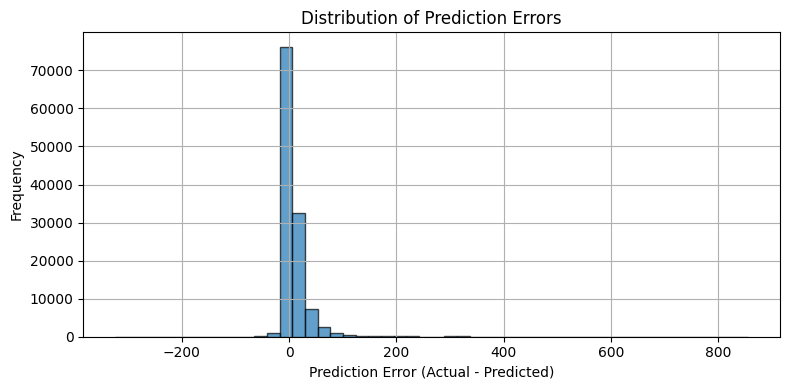

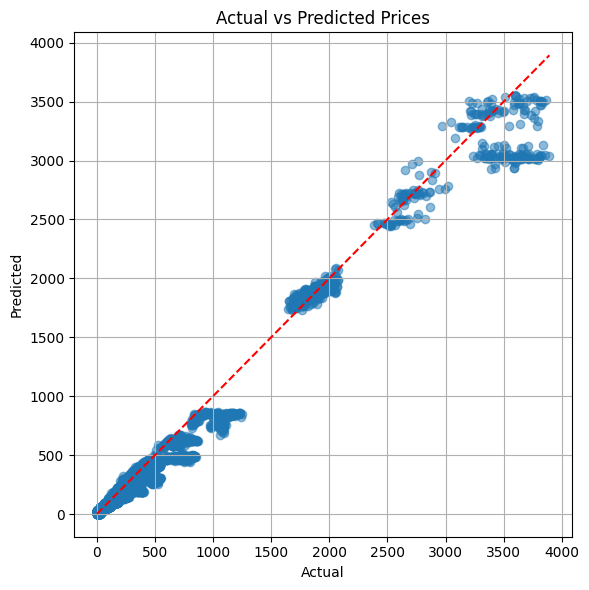

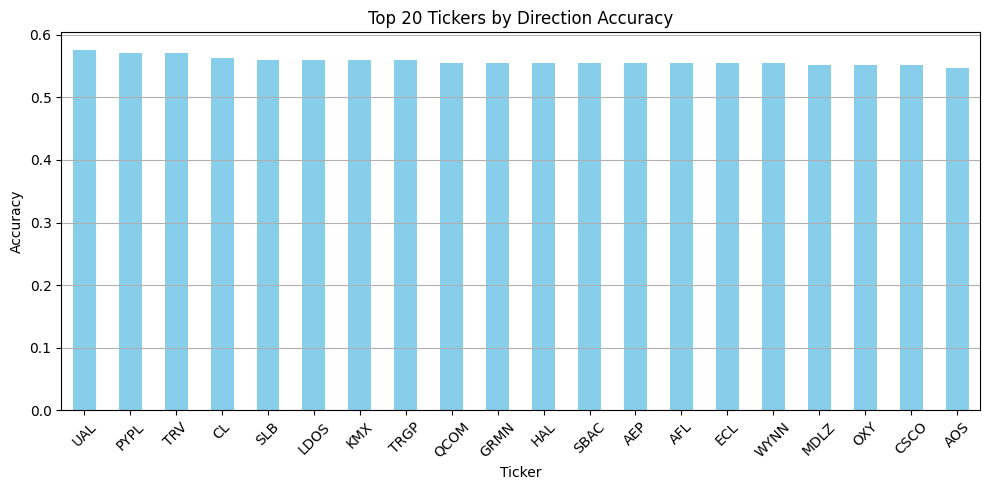

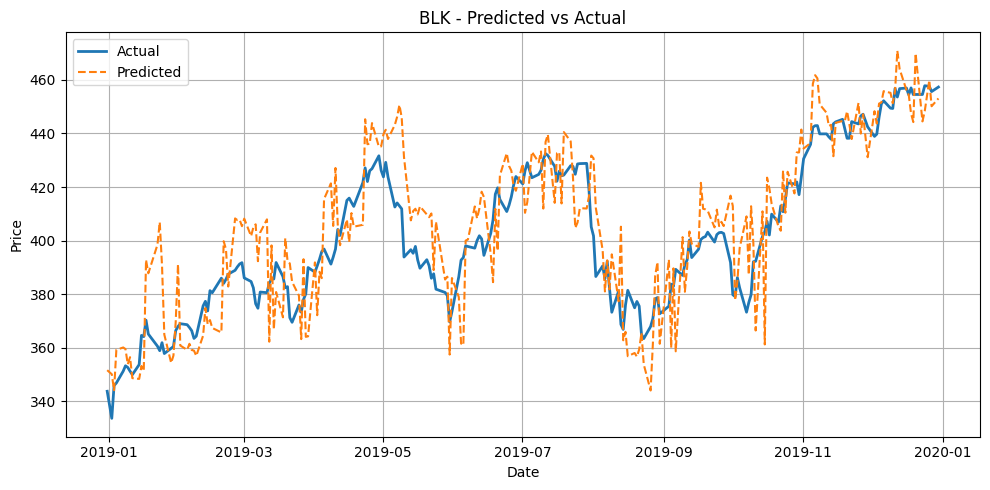

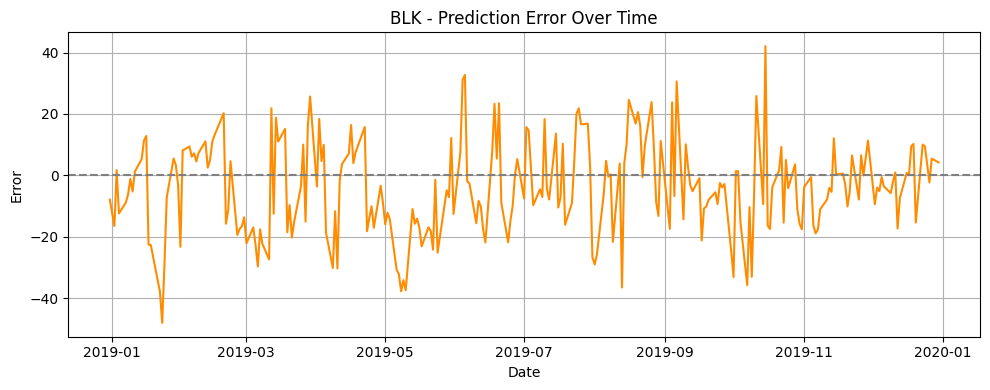

...

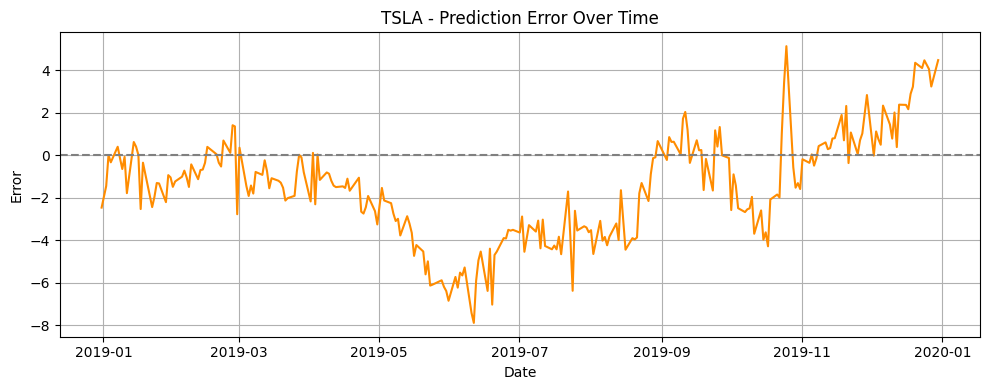

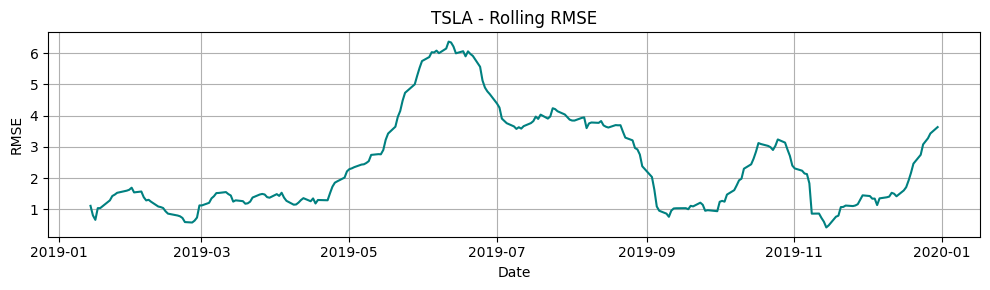

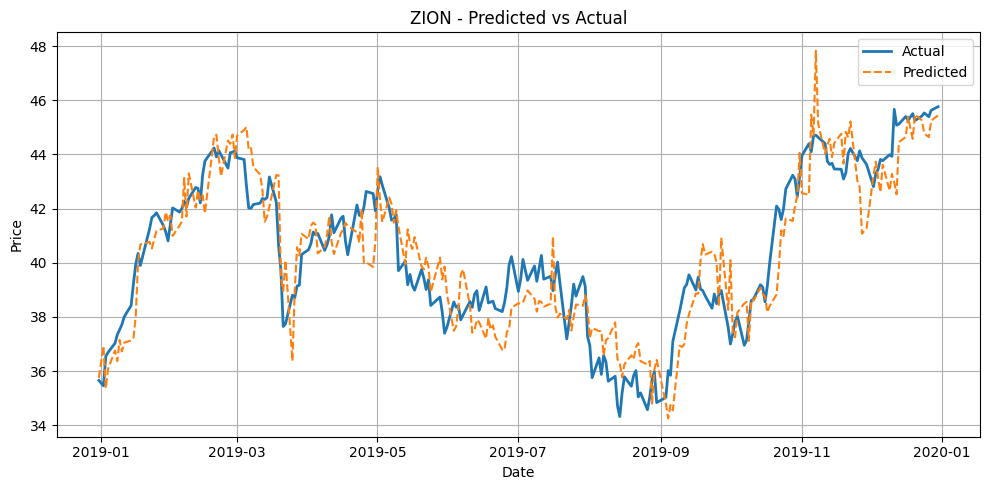

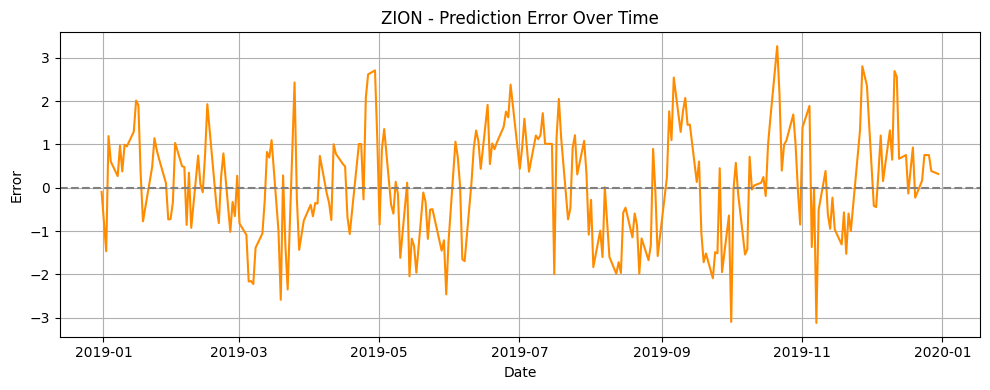

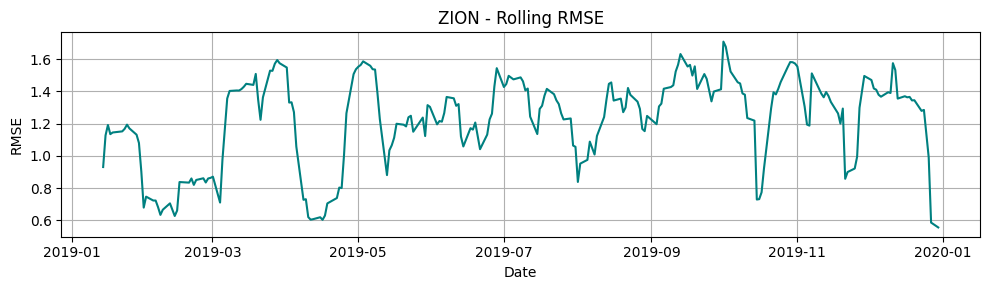


=== Window: 2017-01-01 to 2019-12-31 | Test until 2020-12-31 ===
MAE: 18.2024 | RMSE: 44.1631 | R²: 0.9590 | MAPE: 16.54% | Median AE: 6.4830 | StdErr: 43.2330 | Dir Acc: 49.50%

Top K Stocks by Performance-per-Price:

    Ticker                      Date   Predicted     Actual      Error  \
344    OXY 2020-12-30 05:00:00+00:00   38.666999  16.994709 -21.672290   
82     CCL 2020-12-30 05:00:00+00:00   44.565374  21.660000 -22.905374   
1      AAL 2020-12-30 05:00:00+00:00   28.992612  15.770000 -13.222611   
317   NCLH 2020-12-30 05:00:00+00:00   46.018600  25.430000 -20.588599   
174   FANG 2020-12-30 05:00:00+00:00   68.936885  43.001240 -25.935645   
399    SLB 2020-12-30 05:00:00+00:00   33.016213  20.840059 -12.176153   
37     APA 2020-12-30 05:00:00+00:00   21.172803  13.613287  -7.559516   
480    XOM 2020-12-30 05:00:00+00:00   56.511180  36.447617 -20.063563   
403    SPG 2020-12-30 05:00:00+00:00  113.491884  73.266525 -40.225358   
469    WFC 2020-12-30 05:00:00+00:00   4

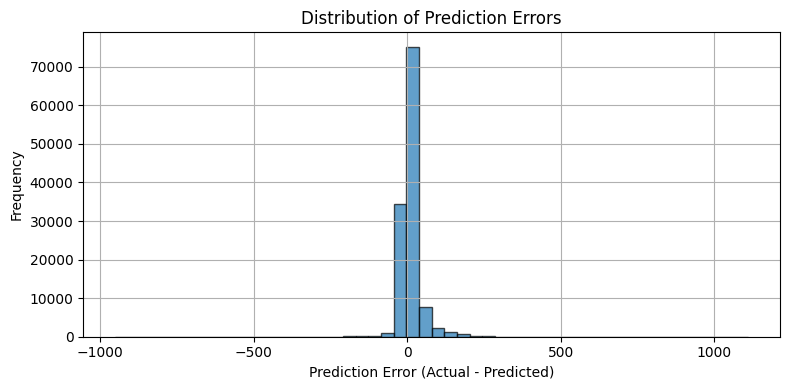

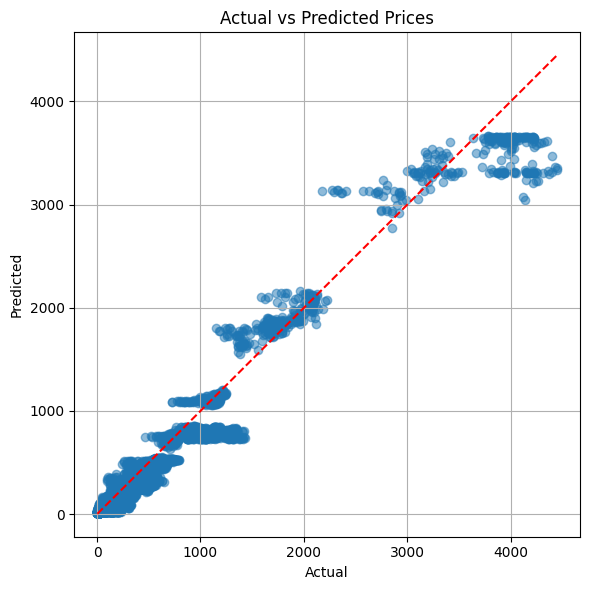

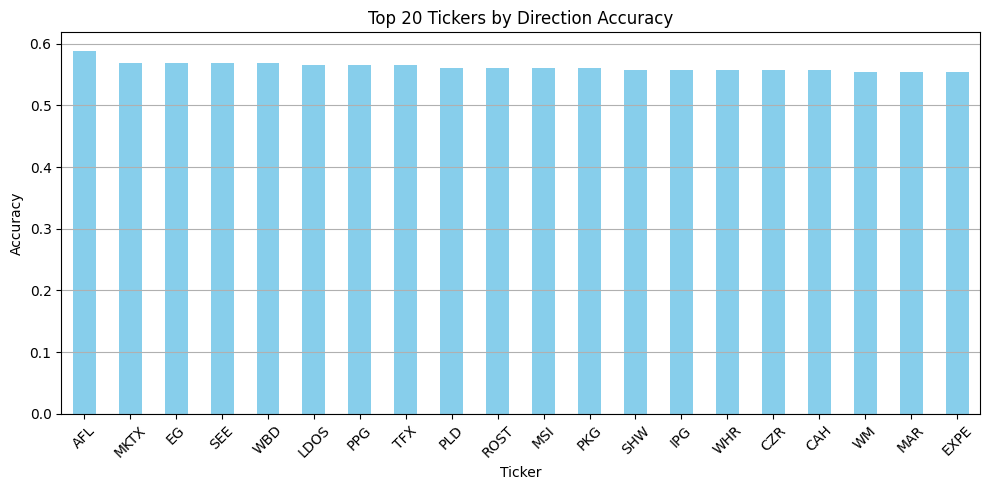

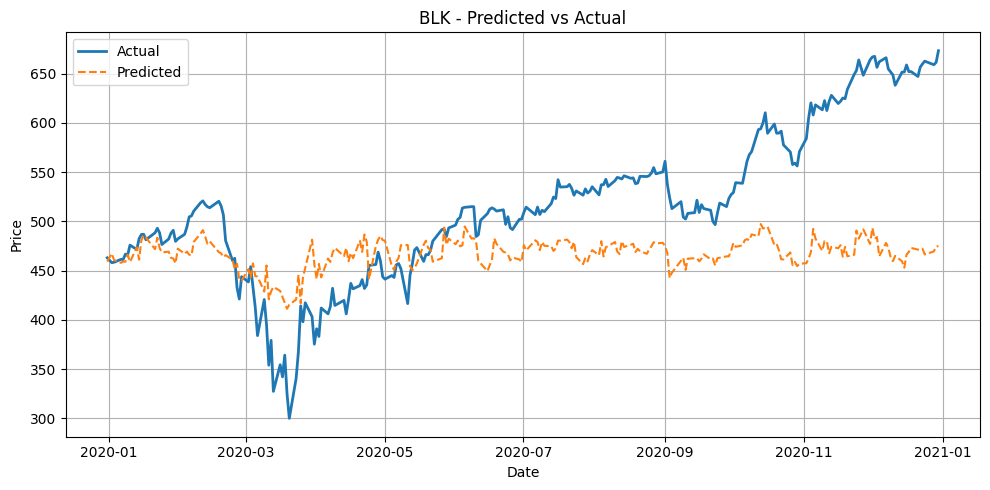

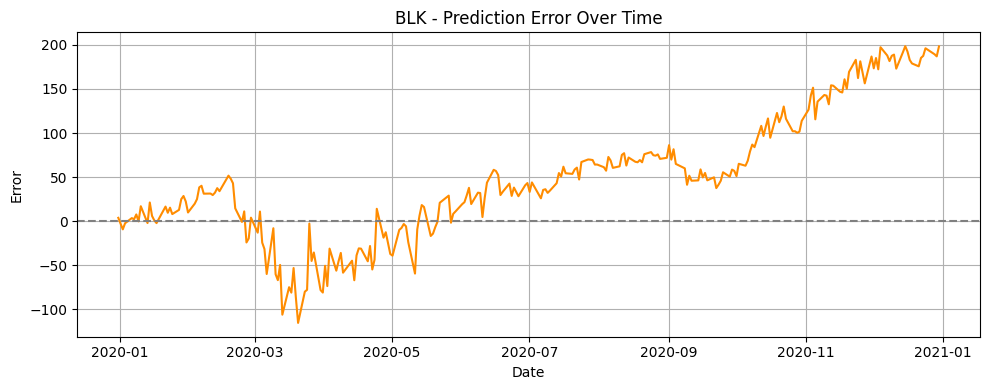

...

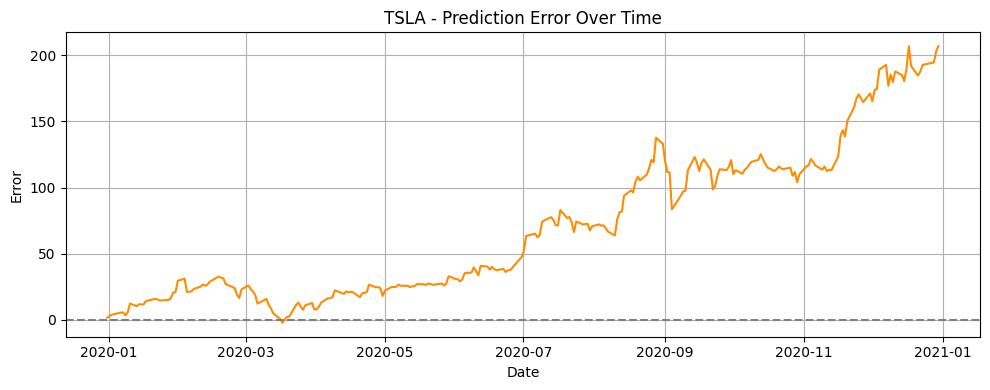

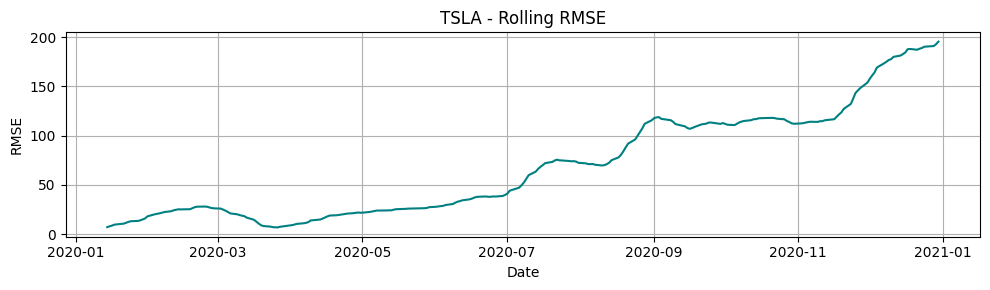

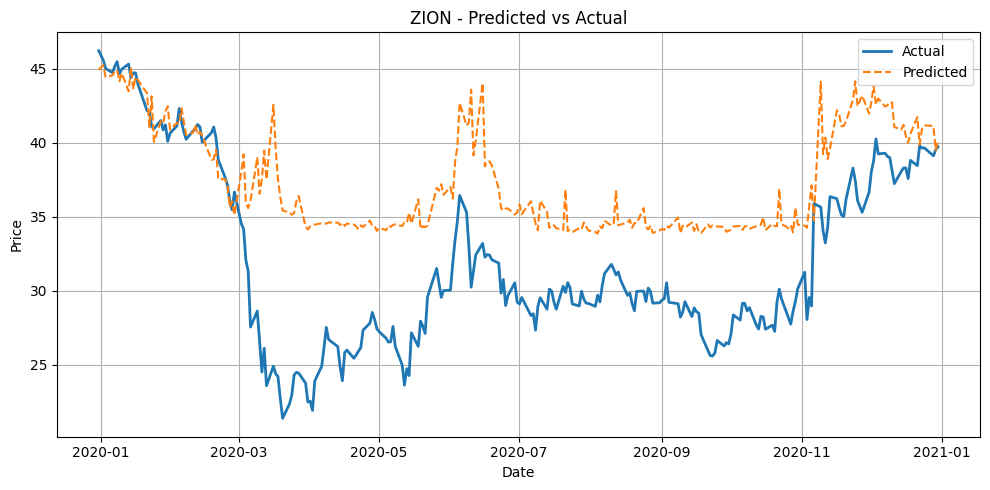

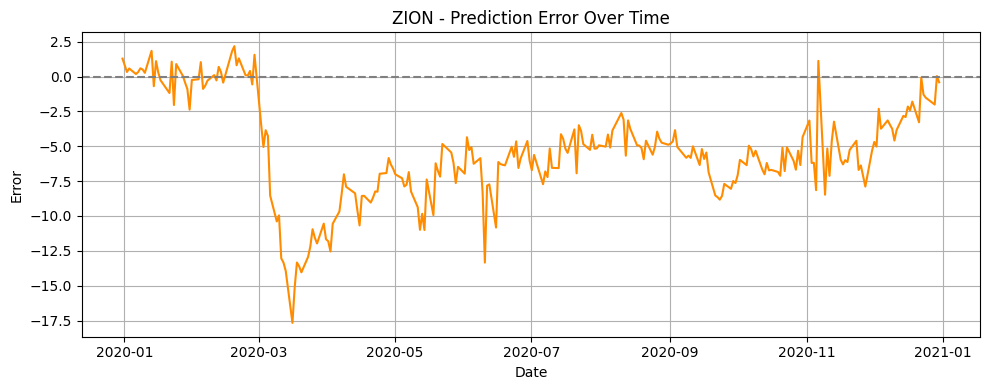

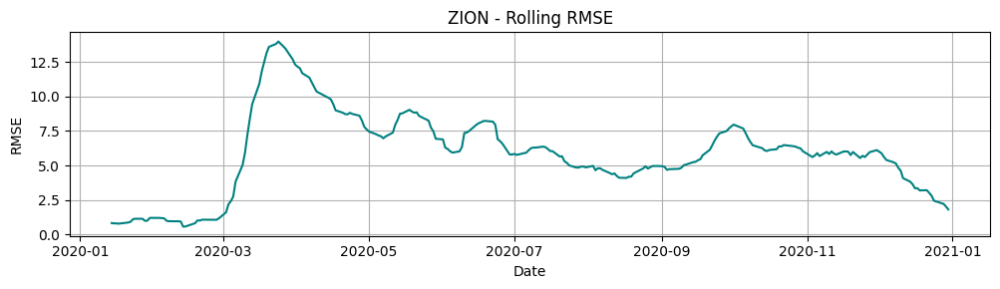


=== Window: 2018-01-01 to 2020-12-31 | Test until 2021-12-31 ===
MAE: 25.8376 | RMSE: 65.8649 | R²: 0.9495 | MAPE: 12.55% | Median AE: 8.6289 | StdErr: 61.1601 | Dir Acc: 48.45%

Top K Stocks by Performance-per-Price:

    Ticker                      Date   Predicted      Actual      Error  \
279    LVS 2021-12-30 05:00:00+00:00   46.909756   37.510075  -9.399681   
462   VTRS 2021-12-30 05:00:00+00:00   15.574941   12.541644  -3.033297   
318   NCLH 2021-12-30 05:00:00+00:00   24.394400   20.740000  -3.654400   
60    BIIB 2021-12-30 05:00:00+00:00  266.102500  239.919998 -26.182502   
205    GPN 2021-12-30 05:00:00+00:00  145.721444  133.119965 -12.601479   
346    OXY 2021-12-30 05:00:00+00:00   30.448018   28.501982  -1.946037   
190   FSLR 2021-12-30 05:00:00+00:00   92.877617   87.160004  -5.717613   
234   INCY 2021-12-30 05:00:00+00:00   78.046200   73.400002  -4.646199   
376   PYPL 2021-12-30 05:00:00+00:00  198.667003  188.580002 -10.087002   
431    TPR 2021-12-30 05:00:00

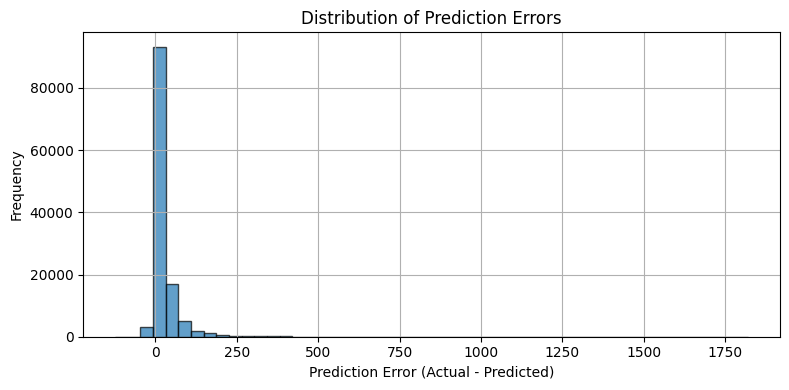

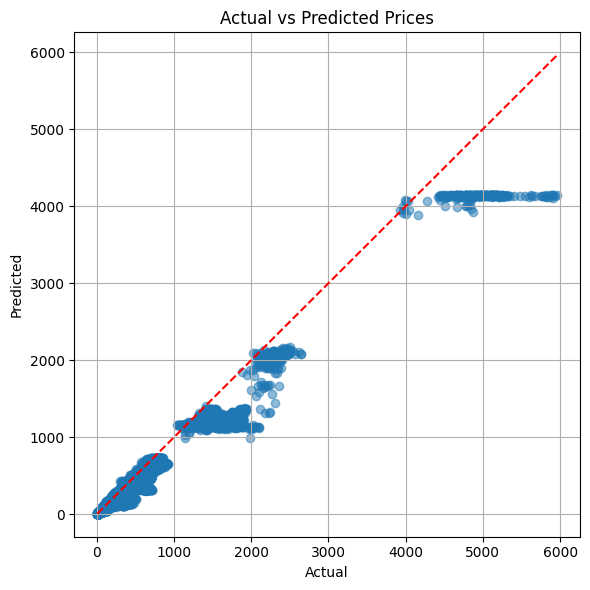

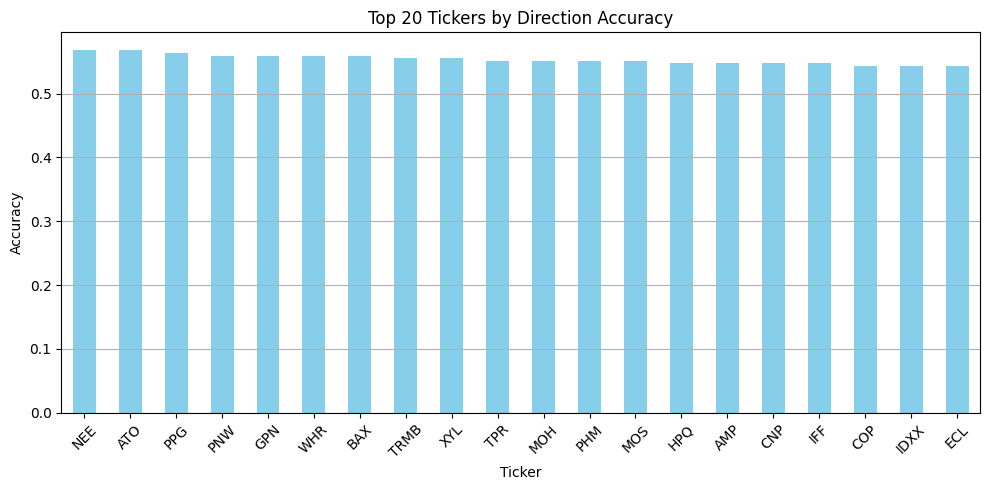

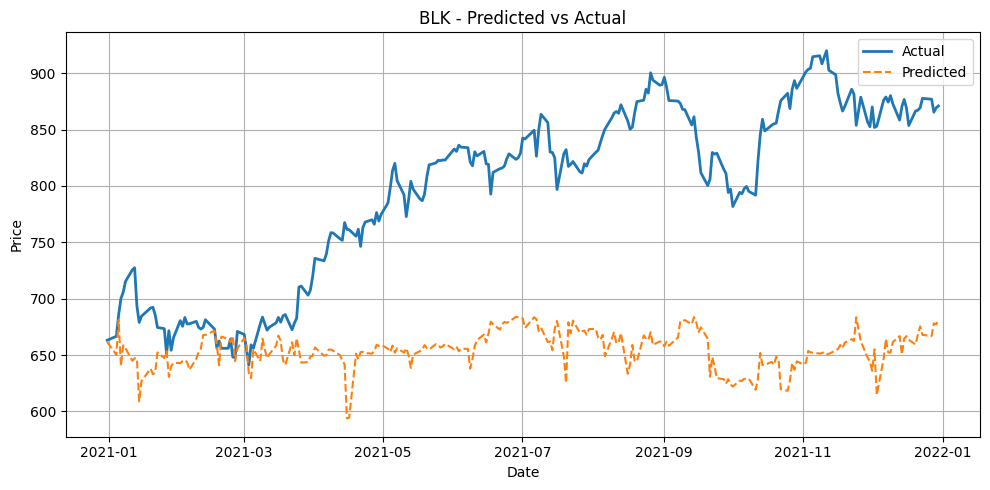

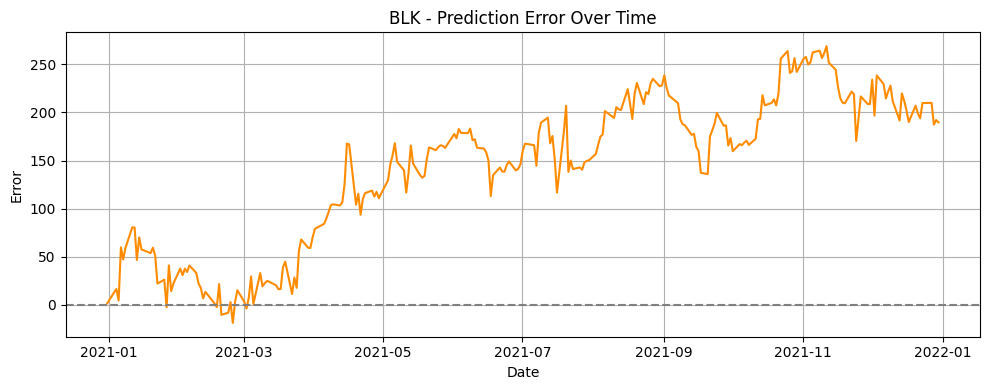

...

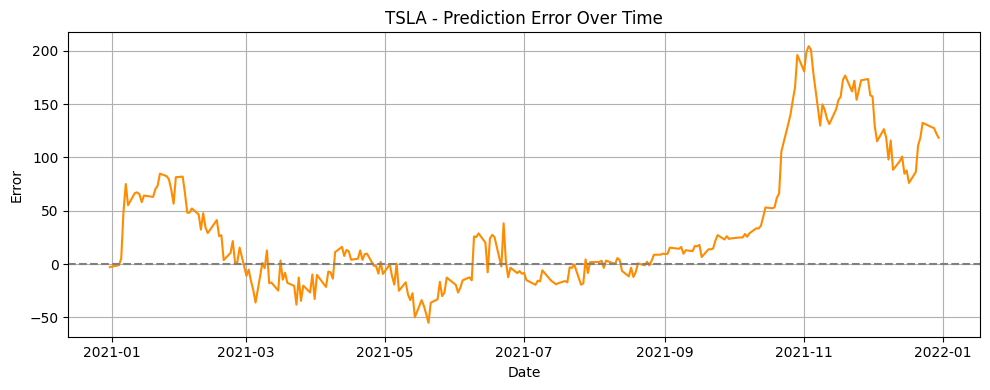

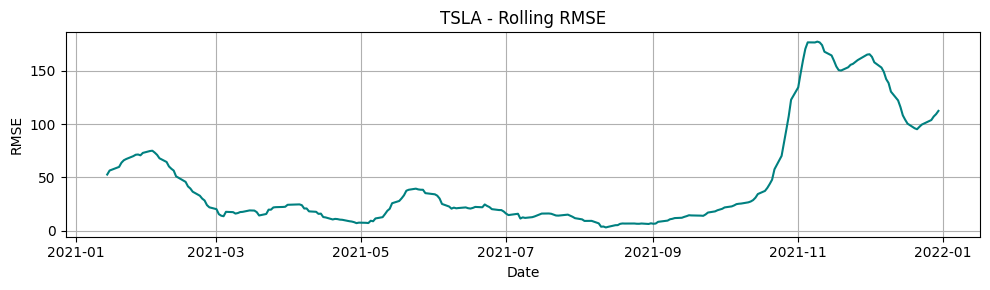

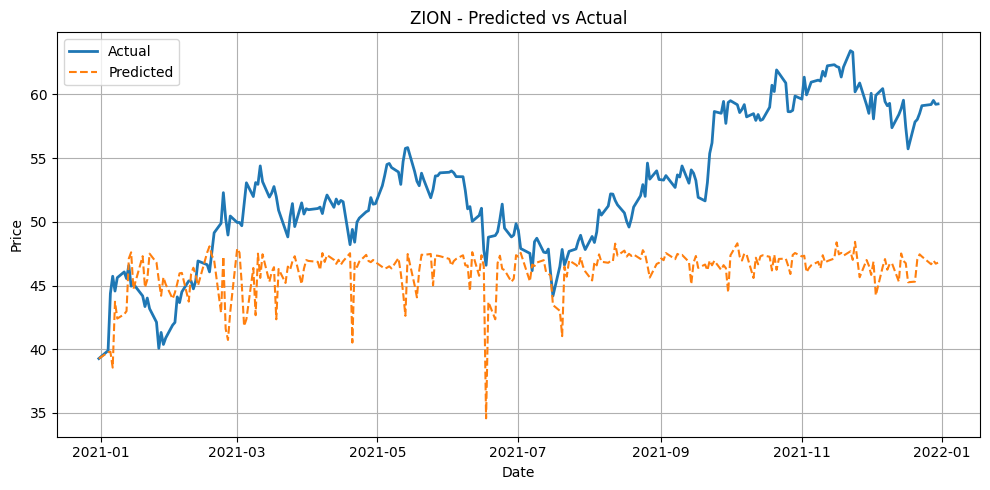

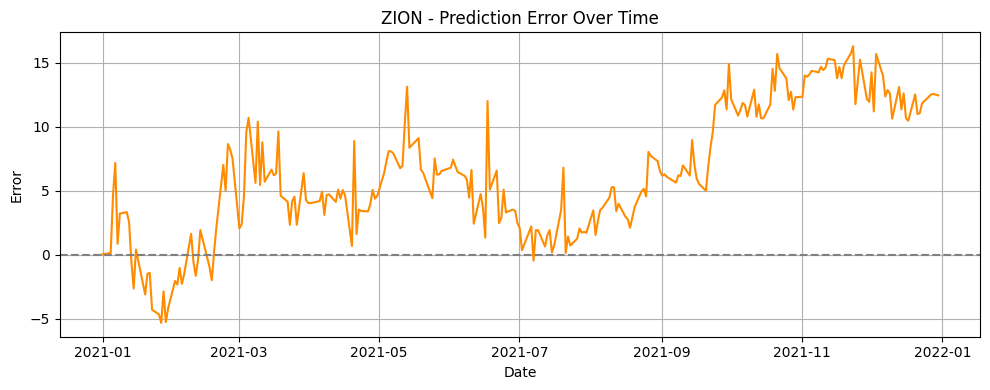

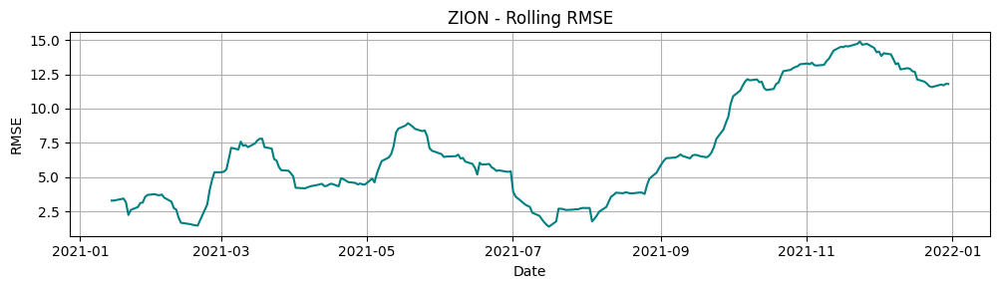


=== Window: 2019-01-01 to 2021-12-31 | Test until 2022-12-31 ===
MAE: 12.5096 | RMSE: 35.9987 | R²: 0.9830 | MAPE: 7.94% | Median AE: 5.0788 | StdErr: 35.9745 | Dir Acc: 49.98%

Top K Stocks by Performance-per-Price:

    Ticker                      Date    Predicted      Actual        Error  \
100    CMG 2022-12-30 05:00:00+00:00  1340.239607   27.422600 -1312.817007   
278   LRCX 2022-12-30 05:00:00+00:00   528.864390   40.817795  -488.046595   
45    AVGO 2022-12-30 05:00:00+00:00   530.007077   53.236023  -476.771054   
334   NVDA 2022-12-30 05:00:00+00:00   136.389594   14.303279  -122.086315   
438   TSCO 2022-12-30 05:00:00+00:00   223.827433   43.686382  -180.141051   
34    ANET 2022-12-30 05:00:00+00:00   132.924349   30.227501  -102.696848   
106    COO 2022-12-30 05:00:00+00:00   330.393311   83.156250  -247.237061   
118   CTAS 2022-12-30 05:00:00+00:00   428.965066  110.815269  -318.149796   
477    WMT 2022-12-30 05:00:00+00:00   139.600894   46.349461   -93.251434   
4

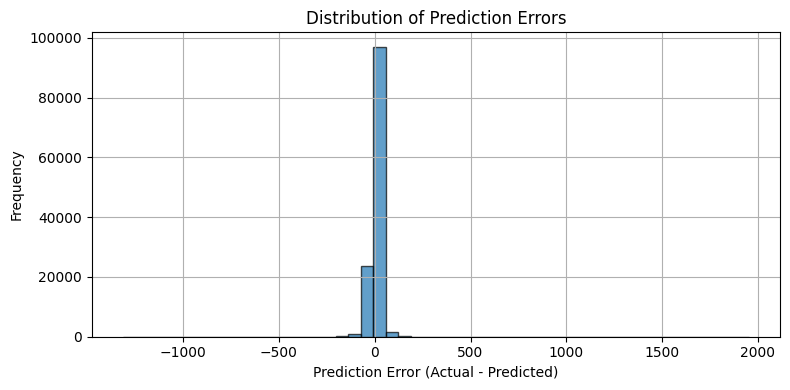

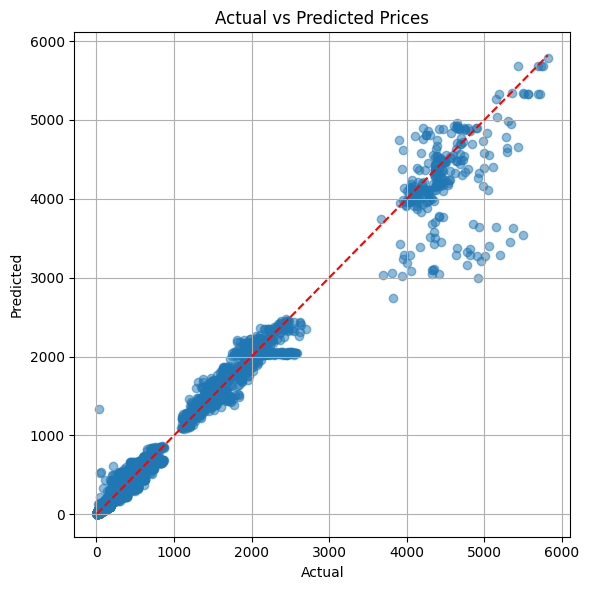

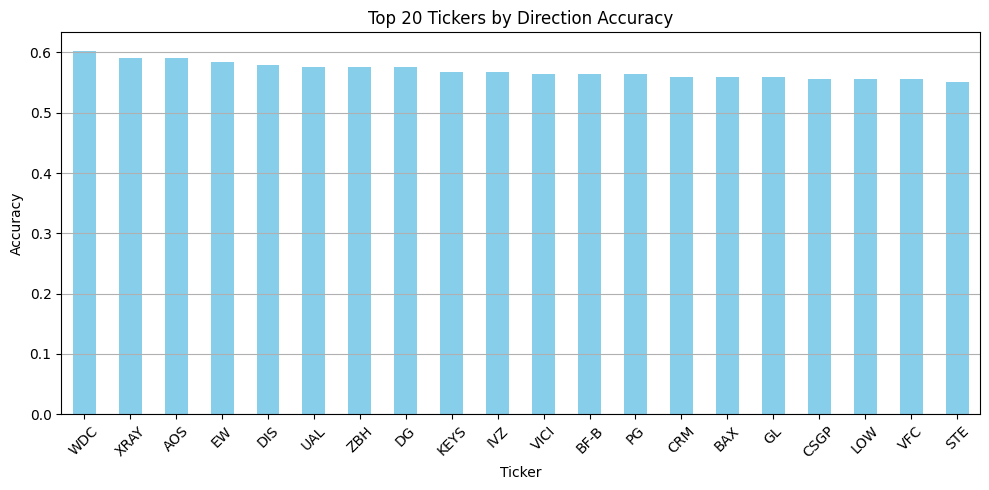

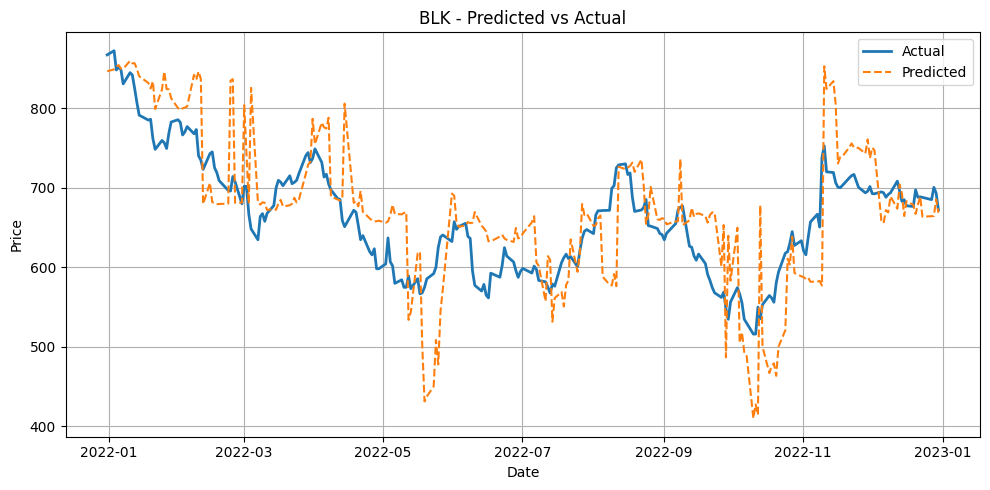

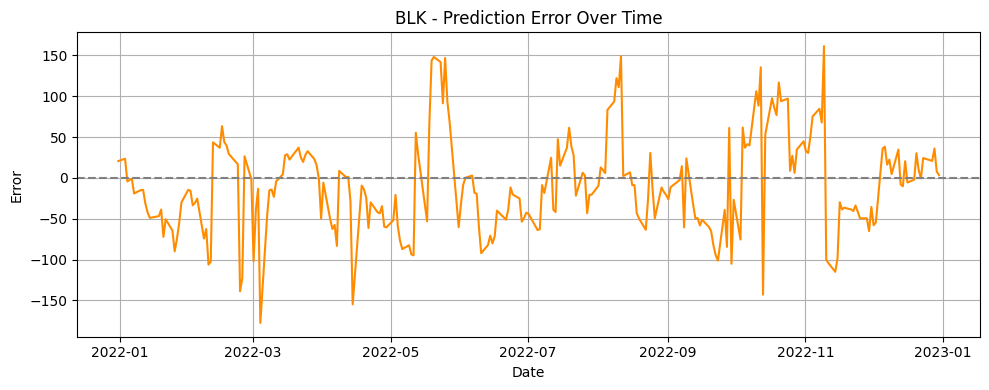

...

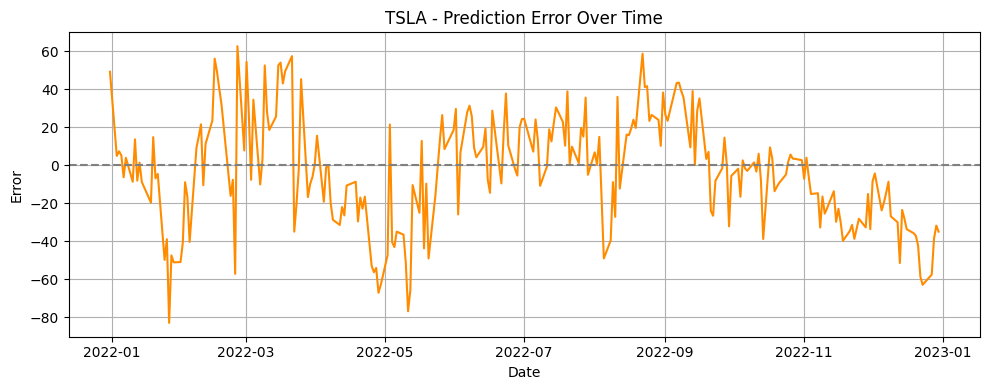

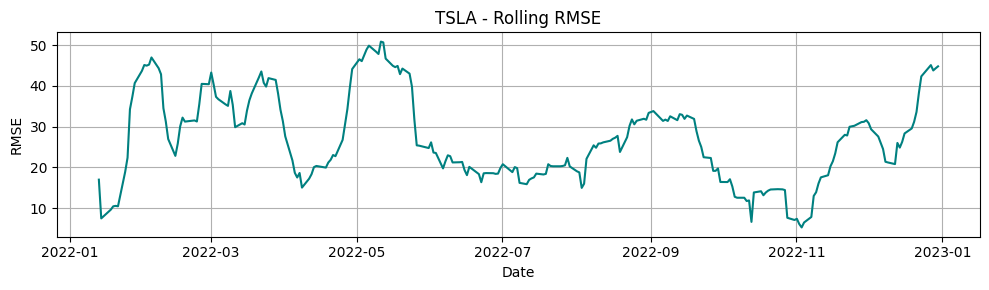

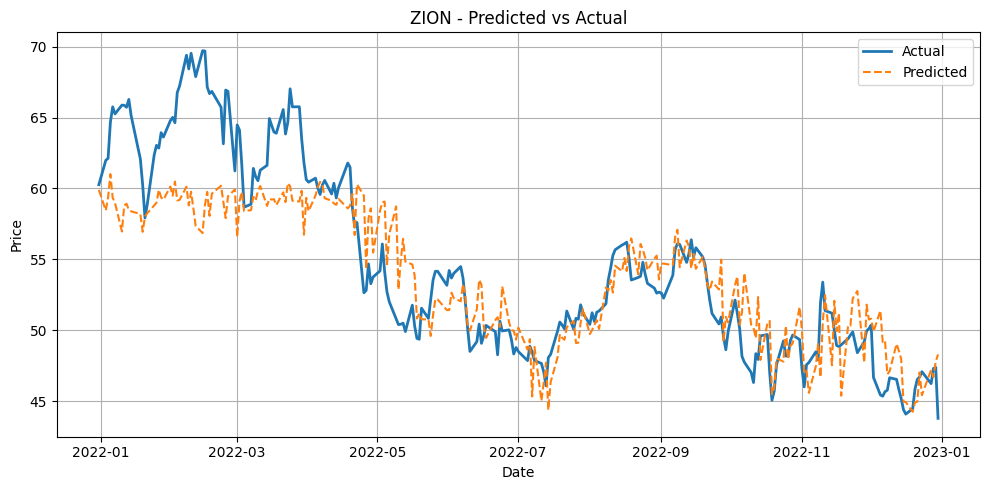

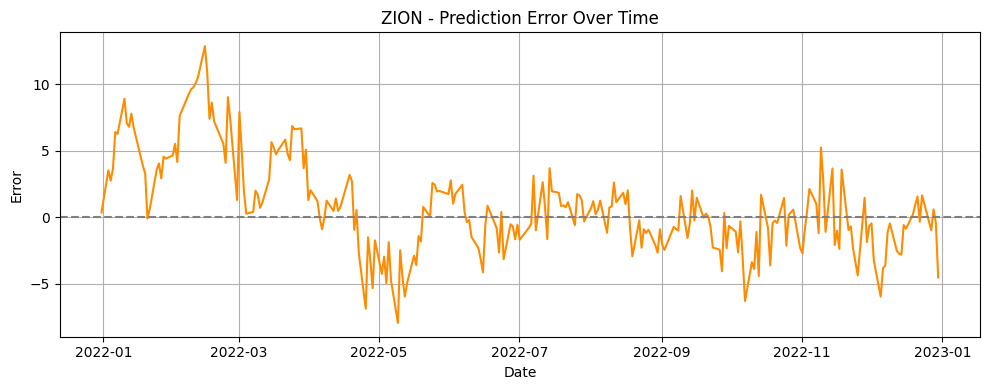

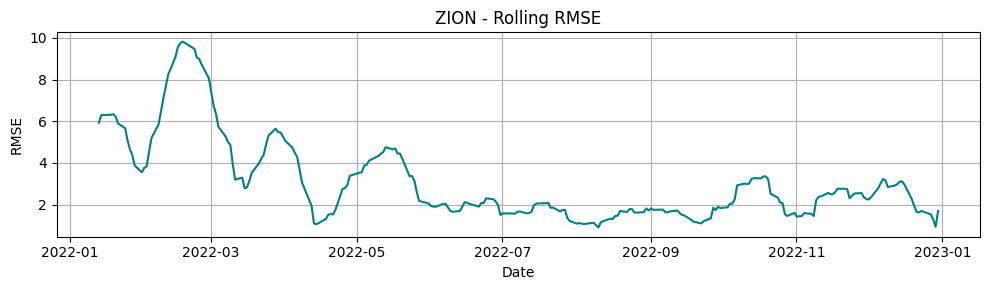


=== Window: 2020-01-01 to 2022-12-31 | Test until 2023-12-31 ===
MAE: 17.0923 | RMSE: 75.3987 | R²: 0.9502 | MAPE: 15.68% | Median AE: 4.7756 | StdErr: 75.3108 | Dir Acc: 31.54%

Top K Stocks by Performance-per-Price:

    Ticker                      Date   Predicted      Actual       Error  \
101    CMG 2023-12-29 00:00:00+00:00  817.339204   44.895000 -772.444204   
279   LRCX 2023-12-29 00:00:00+00:00  278.994504   74.250008 -204.744496   
107    COO 2023-12-29 00:00:00+00:00  291.571623   93.269997 -198.301626   
45    AVGO 2023-12-29 00:00:00+00:00  245.002649  106.772415 -138.230234   
439   TSCO 2023-12-29 00:00:00+00:00   90.224830   42.599834  -47.624995   
478    WMT 2023-12-29 00:00:00+00:00  107.628577   52.197887  -55.430690   
342    OGN 2023-12-29 00:00:00+00:00   24.265256   13.565531  -10.699725   
168    ETR 2023-12-29 00:00:00+00:00   84.224028   49.641434  -34.582594   
235   ILMN 2023-12-29 00:00:00+00:00  217.347200  133.861862  -83.485338   
457    VFC 2023-12-2

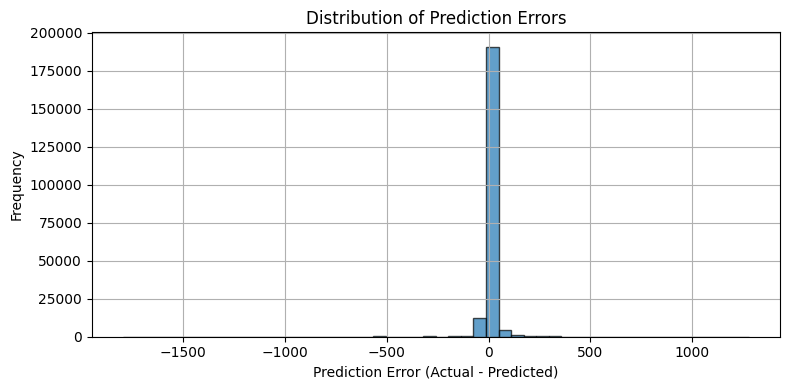

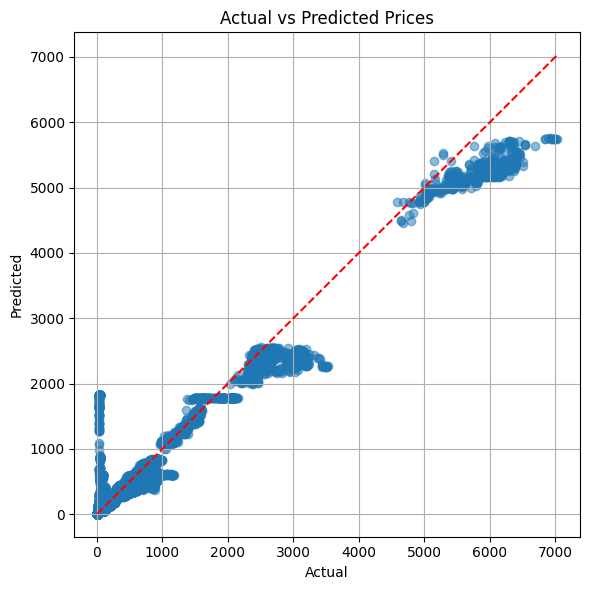

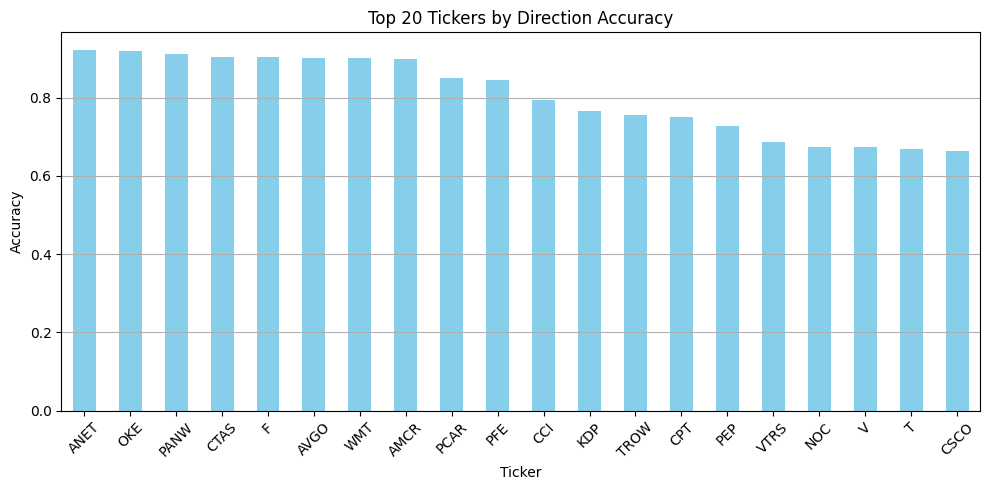

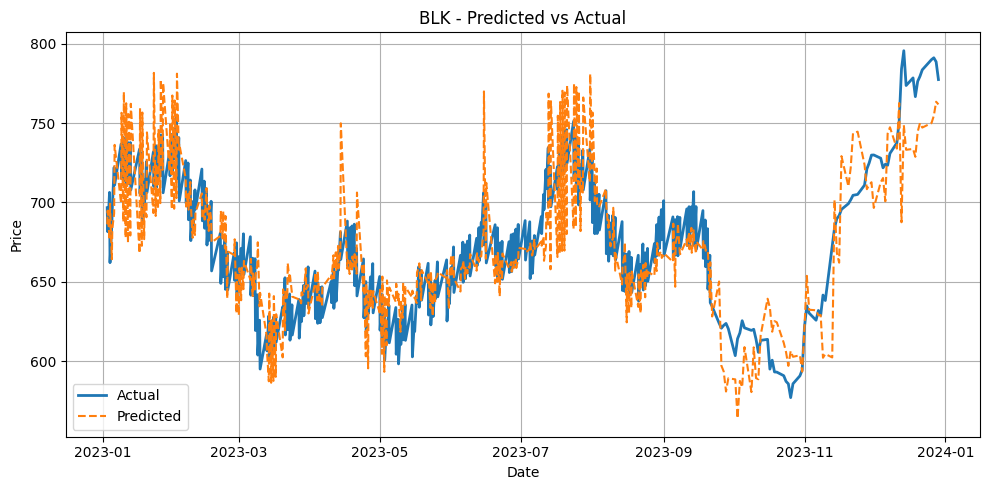

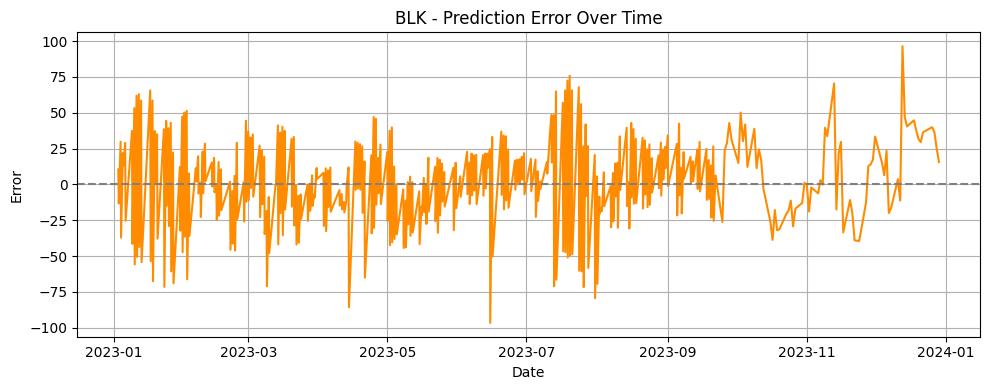

...

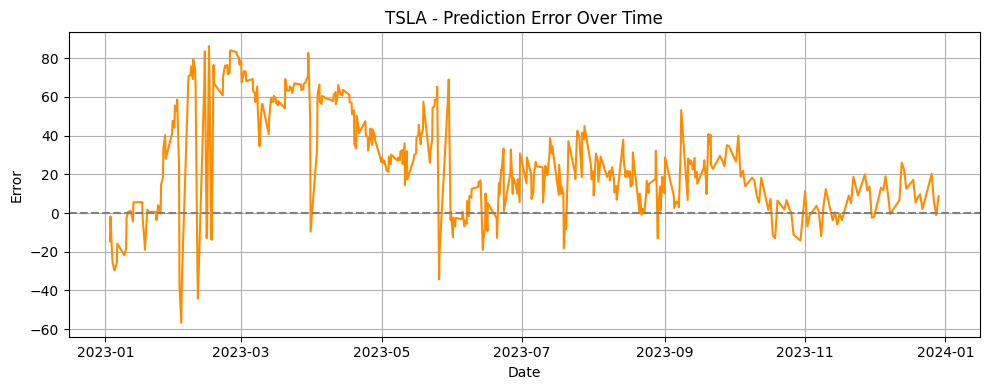

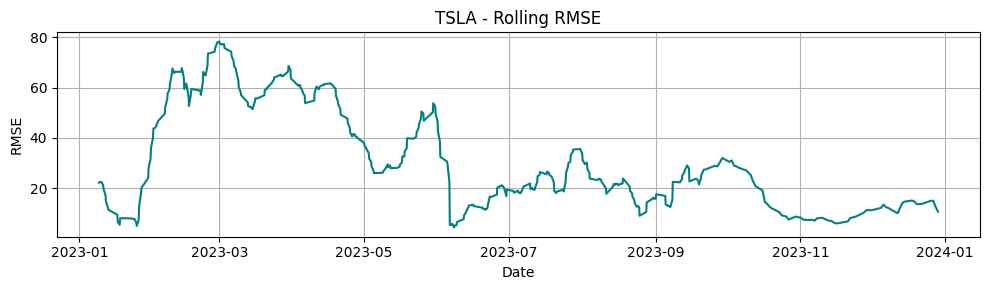

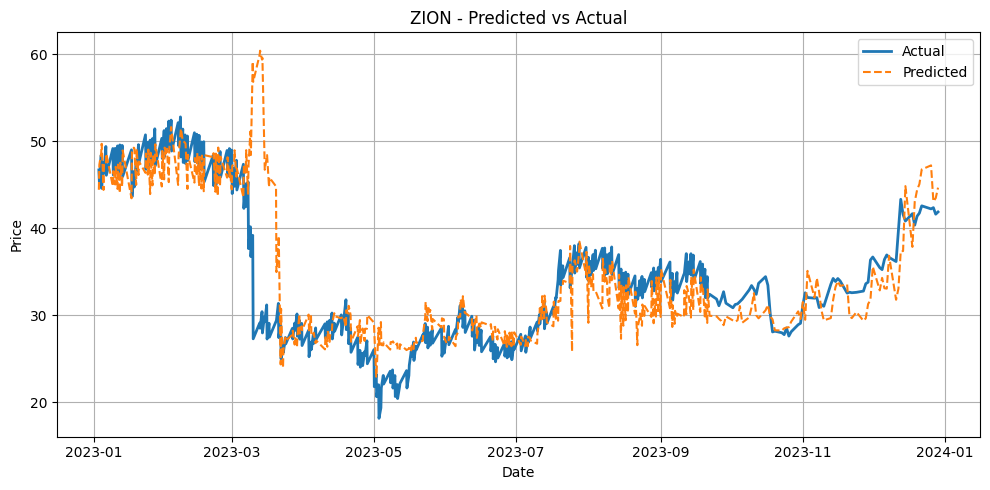

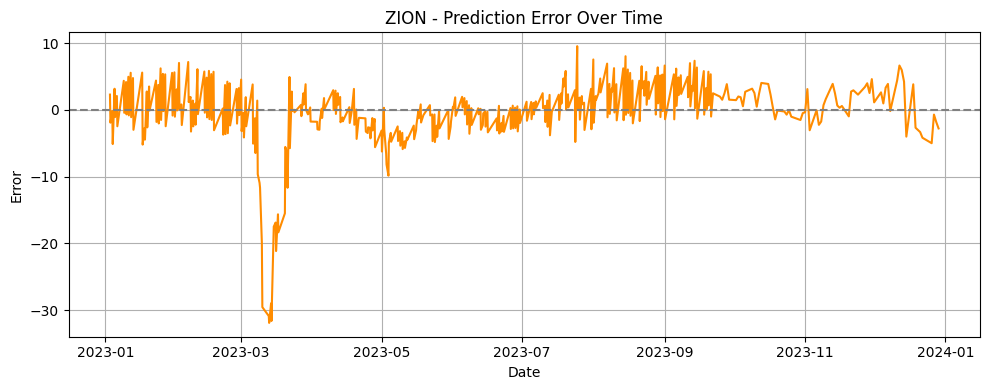

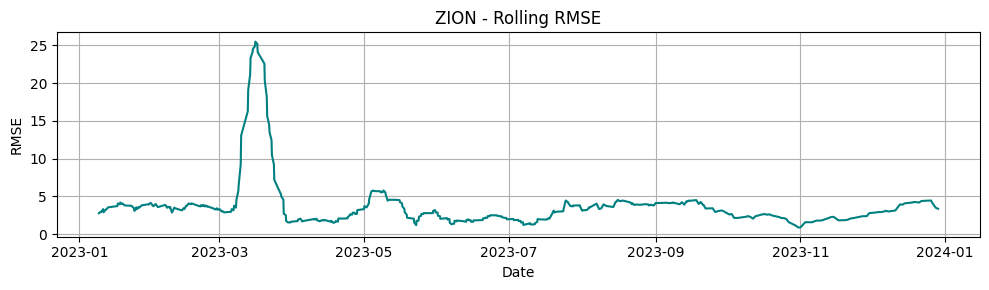


=== Window: 2021-01-01 to 2023-12-30 | Test until 2024-12-30 ===
MAE: 25.3810 | RMSE: 113.8961 | R²: 0.9393 | MAPE: 9.29% | Median AE: 4.7096 | StdErr: 111.8878 | Dir Acc: 49.49%

Top K Stocks by Performance-per-Price:

    Ticker                      Date   Predicted      Actual       Error  \
402   SEDG 2024-12-19 00:00:00+00:00   97.209200   14.770000  -82.439200   
471    WBA 2024-12-19 00:00:00+00:00   20.140664    9.550000  -10.590663   
313   MRNA 2024-12-19 00:00:00+00:00   76.296001   39.389999  -36.906001   
155     EL 2024-12-19 00:00:00+00:00  127.879785   73.626144  -54.253641   
488   XRAY 2024-12-19 00:00:00+00:00   29.036154   18.354134  -10.682020   
229    HUM 2024-12-19 00:00:00+00:00  376.344664  245.433945 -130.910719   
131     DG 2024-12-19 00:00:00+00:00  113.280124   75.319687  -37.960437   
123    CVS 2024-12-19 00:00:00+00:00   64.547290   43.356331  -21.190959   
343   ODFL 2024-12-19 00:00:00+00:00  264.168428  181.079803  -83.088625   
159   ENPH 2024-12-

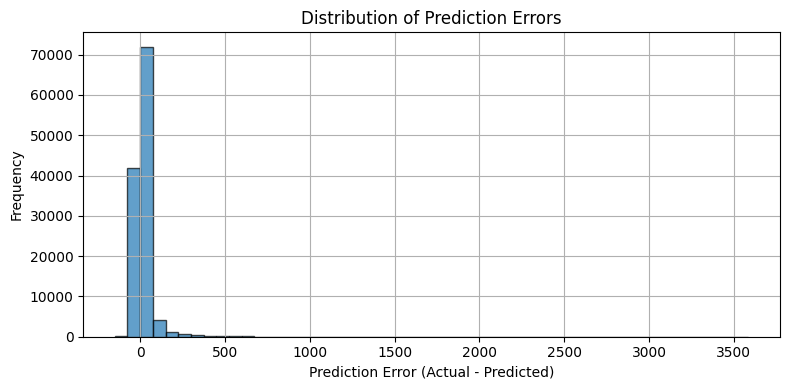

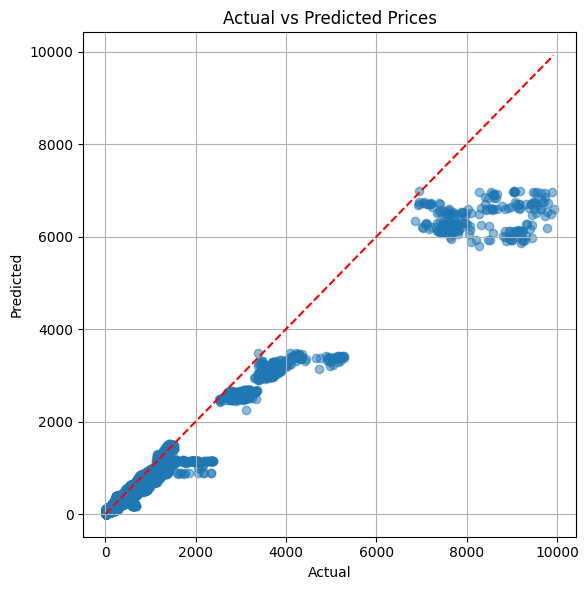

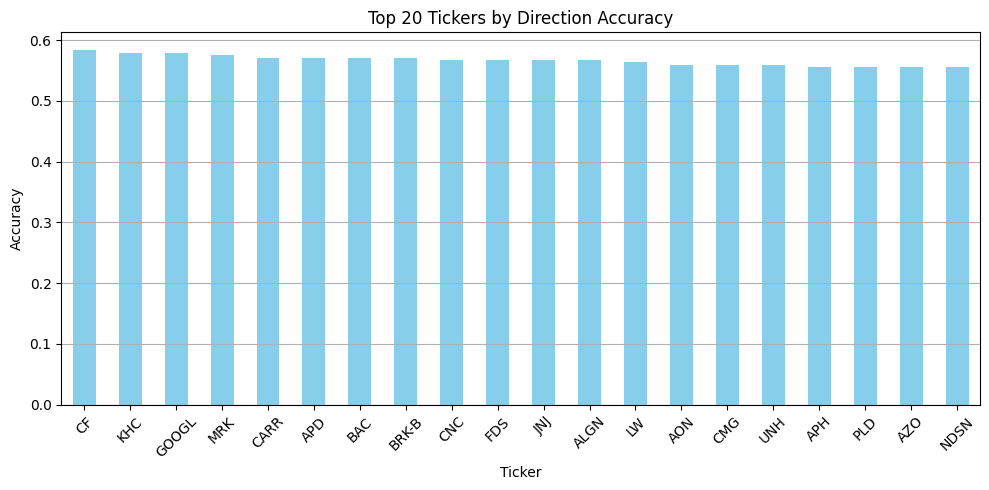

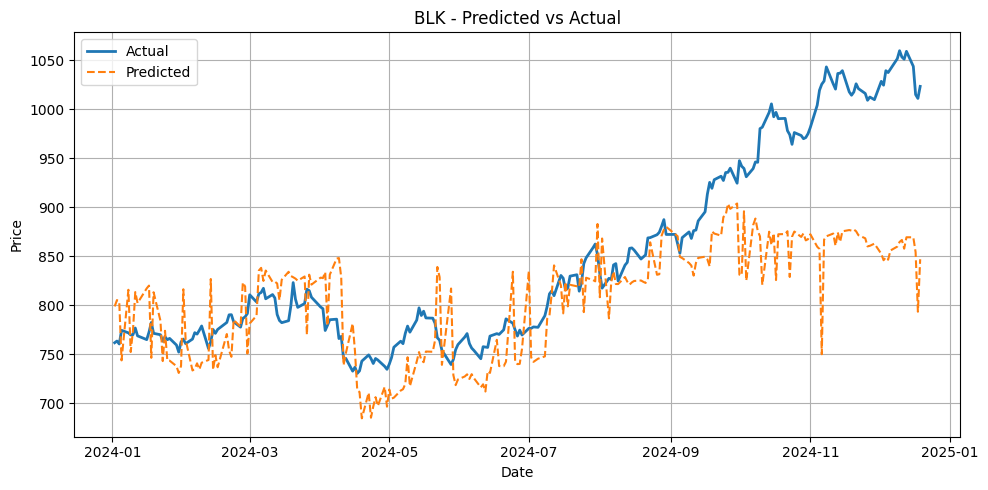

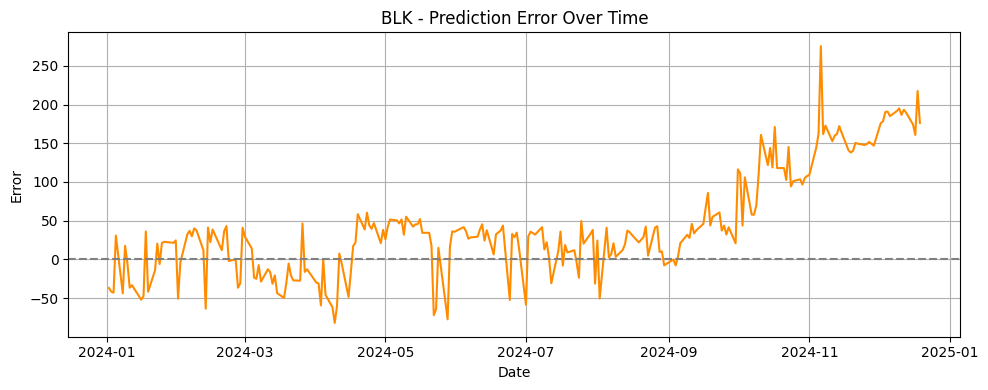

...

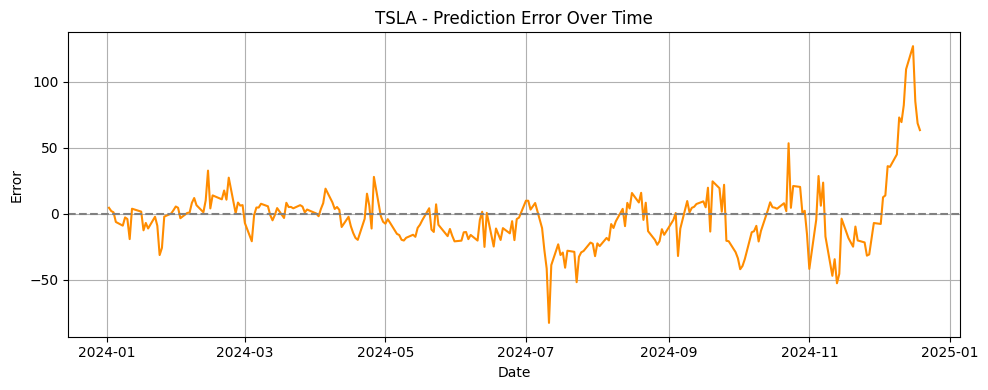

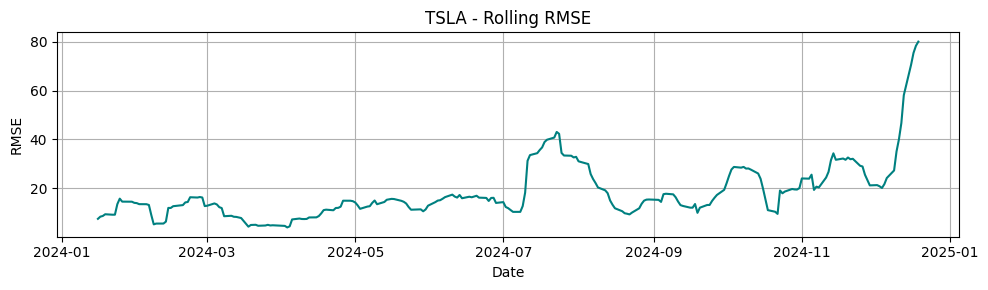

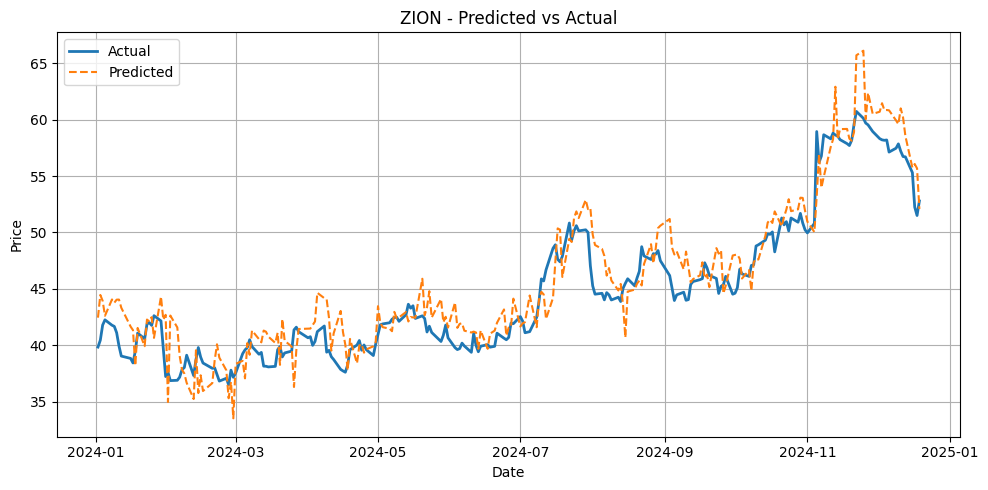

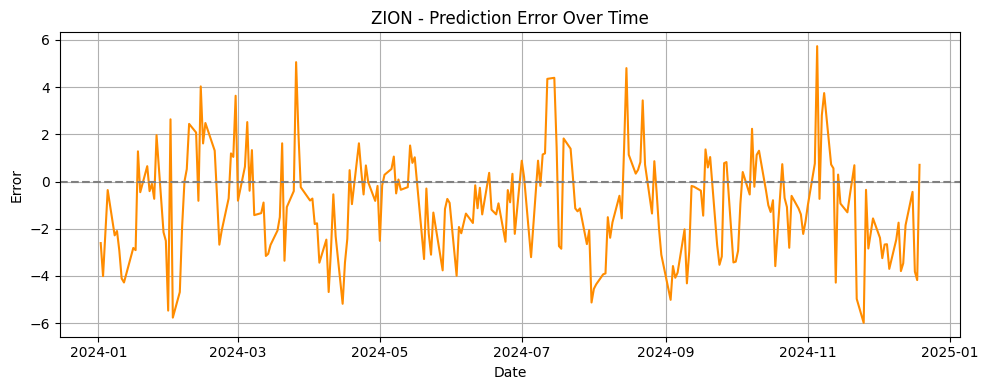

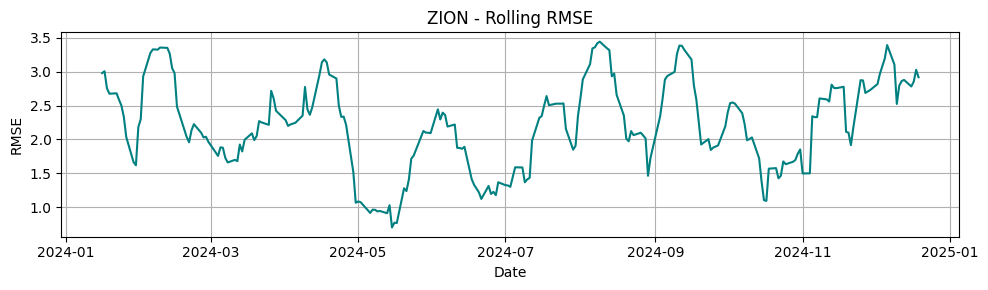


==== Aggregate Metrics Across All Windows ====

     Start        End       MAE       RMSE       R2      MAPE  MedianAE   StdError  DirectionAccuracy
2013-01-01 2015-12-31  5.739670  12.544093 0.987507  8.068302  2.643032  12.062445           0.488985
2014-01-01 2016-12-31 11.660518  50.699979 0.892981  9.923533  3.905700  49.583140           0.489826
2015-01-01 2017-12-31  9.661195  23.530147 0.981115  8.767359  3.695098  22.545647           0.497938
2016-01-01 2018-12-31 12.303608  31.533324 0.973302  9.576355  4.197965  29.988593           0.495769
2017-01-01 2019-12-31 18.202416  44.163068 0.958977 16.539942  6.483021  43.233025           0.495043
2018-01-01 2020-12-31 25.837550  65.864889 0.949457 12.552923  8.628877  61.160062           0.484508
2019-01-01 2021-12-31 12.509611  35.998744 0.982982  7.938098  5.078836  35.974529           0.499831
2020-01-01 2022-12-31 17.092312  75.398696 0.950194 15.678473  4.775605  75.310798           0.315368
2021-01-01 2023-12-30 25.380985 1

In [5]:
example_tickers = ['BLK', 'BA', 'IP', 'ETSY', 'FDX', 'IP', 'NVDA', 'TSLA', 'ZION']
all_window_metrics = []

for start_str, end_str in fiscal_windows:
    start_date = pd.to_datetime(start_str, utc=True)
    end_date = pd.to_datetime(end_str, utc=True)
    test_end_date = end_date + pd.DateOffset(years=1)

    print(f"\n=== Window: {start_date.date()} to {end_date.date()} | Test until {test_end_date.date()} ===")

    all_results = []

    # Combine training data from all tickers for unified PCA/scaler
    all_train_data = []
    for df in preprocessed_data.values():
        segment = df[(df.index >= start_date) & (df.index <= end_date)]
        if len(segment) >= 50:
            all_train_data.append(segment[features])
    if not all_train_data:
        print("No valid training data in this window.")
        continue

    combined_train = pd.concat(all_train_data)
    scaler = StandardScaler().fit(combined_train)
    pca = PCA(n_components=0.99, svd_solver='full').fit(scaler.transform(combined_train))

    for ticker, df in preprocessed_data.items():
        train_df = df[(df.index >= start_date) & (df.index <= end_date)]
        test_df = df[(df.index > end_date) & (df.index <= test_end_date)]

        if len(train_df) < 50 or len(test_df) == 0:
            continue

        X_train_pca = pca.transform(scaler.transform(train_df[features]))

        params = hyperparams_by_ticker.get(ticker, {'n_estimators': 100, 'max_depth': 6})
        reg_model = RandomForestRegressor(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            random_state=42
        )
        reg_model.fit(X_train_pca, train_df['Close_t+5'])

        # Vectorized test prediction
        X_test_pca = pca.transform(scaler.transform(test_df[features]))
        predicted_prices = reg_model.predict(X_test_pca)

        for idx, (timestamp, pred) in enumerate(zip(test_df.index, predicted_prices)):
            future_window = df.loc[(df.index > timestamp) & (df.index <= timestamp + pd.Timedelta(days=6))]
            if not future_window.empty:
                actual_price = future_window.iloc[0]['Close']
                all_results.append({
                    'Ticker': ticker,
                    'Date': timestamp,
                    'Predicted': pred,
                    'Actual': actual_price
                })

    results_df = pd.DataFrame(all_results).drop_duplicates(subset=['Ticker', 'Date'])

    if results_df.empty:
        print("No predictions available for this window.")
        continue

    results_df['Error'] = results_df['Actual'] - results_df['Predicted']
    results_df['Absolute Error'] = results_df['Error'].abs()
    results_df['Pred_Dir'] = np.sign(results_df['Predicted'].diff())
    results_df['Actual_Dir'] = np.sign(results_df['Actual'].diff())
    results_df['Correct_Direction'] = results_df['Pred_Dir'] == results_df['Actual_Dir']

    # Metrics
    mae = mean_absolute_error(results_df['Actual'], results_df['Predicted'])
    mse = mean_squared_error(results_df['Actual'], results_df['Predicted'])
    rmse = np.sqrt(mse)
    r2 = r2_score(results_df['Actual'], results_df['Predicted'])
    mape = np.mean(np.abs((results_df['Actual'] - results_df['Predicted']) / results_df['Actual'])) * 100
    median_ae = median_absolute_error(results_df['Actual'], results_df['Predicted'])
    std_error = results_df['Error'].std()
    dir_acc = results_df['Correct_Direction'].mean()

    print(f"MAE: {mae:.4f} | RMSE: {rmse:.4f} | R²: {r2:.4f} | MAPE: {mape:.2f}% | Median AE: {median_ae:.4f} | StdErr: {std_error:.4f} | Dir Acc: {dir_acc:.2%}")

    all_window_metrics.append({
        'Start': start_date.date(),
        'End': end_date.date(),
        'MAE': mae,
        'RMSE': rmse,
        'R2': r2,
        'MAPE': mape,
        'MedianAE': median_ae,
        'StdError': std_error,
        'DirectionAccuracy': dir_acc
    })

    # Ranking
    stock_latest = results_df.groupby('Ticker').last().reset_index()
    stock_latest['Expected Return'] = stock_latest['Predicted'] - stock_latest['Actual']
    stock_latest['Performance per Price'] = stock_latest['Expected Return'] / stock_latest['Actual']
    stock_latest['Sharpe Ratio'] = stock_latest['Expected Return'] / (stock_latest['Absolute Error'] + 1e-6)

    print("\nTop K Stocks by Performance-per-Price:\n")
    print(stock_latest.sort_values(by='Performance per Price', ascending=False).head(10))

    print("\nTop K Stocks by Expected Return:\n")
    print(stock_latest.sort_values(by='Expected Return', ascending=False).head(10))

    print("\nTop K Stocks by Absolute Error:\n")
    print(stock_latest.sort_values(by='Absolute Error', ascending=False).head(10))

    print("\nTop K Stocks by Sharpe Ratio:\n")
    print(stock_latest.sort_values(by='Sharpe Ratio', ascending=False).head(10))

    # === PLOTTING SECTION ===

    # Error Distribution Histogram
    plt.figure(figsize=(8, 4))
    plt.hist(results_df['Error'], bins=50, alpha=0.7, edgecolor='black')
    plt.title("Distribution of Prediction Errors")
    plt.xlabel("Prediction Error (Actual - Predicted)")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Actual vs Predicted Scatterplot
    plt.figure(figsize=(6, 6))
    plt.scatter(results_df['Actual'], results_df['Predicted'], alpha=0.5)
    plt.plot([results_df['Actual'].min(), results_df['Actual'].max()],
             [results_df['Actual'].min(), results_df['Actual'].max()],
             'r--')
    plt.title("Actual vs Predicted Prices")
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    # Direction Accuracy by Ticker
    dir_acc_by_ticker = results_df.groupby('Ticker')['Correct_Direction'].mean().sort_values(ascending=False)
    plt.figure(figsize=(10, 5))
    dir_acc_by_ticker.head(20).plot(kind='bar', color='skyblue')
    plt.title("Top 20 Tickers by Direction Accuracy")
    plt.ylabel("Accuracy")
    plt.xlabel("Ticker")
    plt.xticks(rotation=45)
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()
    
    # Example Stock Plots
    for ticker in example_tickers:
        stock_df = results_df[results_df['Ticker'] == ticker]
        if stock_df.empty:
            continue
    
        # Actual vs Predicted
        plt.figure(figsize=(10, 5))
        plt.plot(stock_df['Date'], stock_df['Actual'], label='Actual', linewidth=2)
        plt.plot(stock_df['Date'], stock_df['Predicted'], label='Predicted', linestyle='--')
        plt.title(f"{ticker} - Predicted vs Actual")
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    
        # Prediction Error Over Time
        plt.figure(figsize=(10, 4))
        plt.plot(stock_df['Date'], stock_df['Error'], color='darkorange', label='Prediction Error')
        plt.axhline(0, color='gray', linestyle='--')
        plt.title(f"{ticker} - Prediction Error Over Time")
        plt.xlabel('Date')
        plt.ylabel('Error')
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    
        # Optional: Rolling RMSE (window=10)
        if len(stock_df) > 10:
            rolling_rmse = (stock_df['Error'].rolling(window=10).apply(lambda x: np.sqrt(np.mean(x**2))))
            plt.figure(figsize=(10, 3))
            plt.plot(stock_df['Date'], rolling_rmse, label='Rolling RMSE (10)', color='teal')
            plt.title(f"{ticker} - Rolling RMSE")
            plt.xlabel('Date')
            plt.ylabel('RMSE')
            plt.grid(True)
            plt.tight_layout()
            plt.show()

# After all windows processed
summary_df = pd.DataFrame(all_window_metrics)
print("\n==== Aggregate Metrics Across All Windows ====\n")
print(summary_df.to_string(index=False))
print("\nMean Across Windows:")
print(summary_df.mean(numeric_only=True).to_frame().T.round(4))
